In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import scipy.stats as st
import plotly.express as px
import matplotlib.pyplot as plt
from collections import Counter
from ydata_profiling import ProfileReport
import warnings 
warnings.filterwarnings("ignore")
sns.set(color_codes = True)   
sns.set_palette(palette = 'inferno', n_colors = 8)
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv("/kaggle/input/mxmh-survey-results/mxmh_survey_results.csv")
df=data.copy()
df

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
2,8/27/2022 21:28:18,18.0,Spotify,4.0,No,No,No,Video game music,No,Yes,...,Never,Rarely,Rarely,Very frequently,7.0,7.0,10.0,2.0,No effect,I understand.
3,8/27/2022 21:40:40,61.0,YouTube Music,2.5,Yes,No,Yes,Jazz,Yes,Yes,...,Sometimes,Never,Never,Never,9.0,7.0,3.0,3.0,Improve,I understand.
4,8/27/2022 21:54:47,18.0,Spotify,4.0,Yes,No,No,R&B,Yes,No,...,Very frequently,Very frequently,Never,Rarely,7.0,2.0,5.0,9.0,Improve,I understand.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,10/30/2022 14:37:28,17.0,Spotify,2.0,Yes,Yes,No,Rock,Yes,Yes,...,Never,Rarely,Very frequently,Never,7.0,6.0,0.0,9.0,Improve,I understand.
732,11/1/2022 22:26:42,18.0,Spotify,1.0,Yes,Yes,No,Pop,Yes,Yes,...,Never,Never,Sometimes,Sometimes,3.0,2.0,2.0,5.0,Improve,I understand.
733,11/3/2022 23:24:38,19.0,Other streaming service,6.0,Yes,No,Yes,Rap,Yes,No,...,Sometimes,Sometimes,Rarely,Rarely,2.0,2.0,2.0,2.0,Improve,I understand.
734,11/4/2022 17:31:47,19.0,Spotify,5.0,Yes,Yes,No,Classical,No,No,...,Never,Never,Never,Sometimes,2.0,3.0,2.0,1.0,Improve,I understand.


In [3]:
df.columns

Index(['Timestamp', 'Age', 'Primary streaming service', 'Hours per day',
       'While working', 'Instrumentalist', 'Composer', 'Fav genre',
       'Exploratory', 'Foreign languages', 'BPM', 'Frequency [Classical]',
       'Frequency [Country]', 'Frequency [EDM]', 'Frequency [Folk]',
       'Frequency [Gospel]', 'Frequency [Hip hop]', 'Frequency [Jazz]',
       'Frequency [K pop]', 'Frequency [Latin]', 'Frequency [Lofi]',
       'Frequency [Metal]', 'Frequency [Pop]', 'Frequency [R&B]',
       'Frequency [Rap]', 'Frequency [Rock]', 'Frequency [Video game music]',
       'Anxiety', 'Depression', 'Insomnia', 'OCD', 'Music effects',
       'Permissions'],
      dtype='object')

In [4]:
df.shape

(736, 33)

- There are 33 columns & 736 rows in this dataset..

In [5]:
def check_df(df: object, head: object = 10) -> object:
    print("\nShape")
    print(df.shape)
    print("\nTypes")
    print(df.dtypes)
    print("\nNANs")
    print(df.isnull().sum())
    print("\nInfo")
    print(df.info())
check_df(df)


Shape
(736, 33)

Types
Timestamp                        object
Age                             float64
Primary streaming service        object
Hours per day                   float64
While working                    object
Instrumentalist                  object
Composer                         object
Fav genre                        object
Exploratory                      object
Foreign languages                object
BPM                             float64
Frequency [Classical]            object
Frequency [Country]              object
Frequency [EDM]                  object
Frequency [Folk]                 object
Frequency [Gospel]               object
Frequency [Hip hop]              object
Frequency [Jazz]                 object
Frequency [K pop]                object
Frequency [Latin]                object
Frequency [Lofi]                 object
Frequency [Metal]                object
Frequency [Pop]                  object
Frequency [R&B]                  object
Frequency [Rap] 

In [6]:
print('Number of duplicated rows: ' , len(df[df.duplicated()]))

Number of duplicated rows:  0


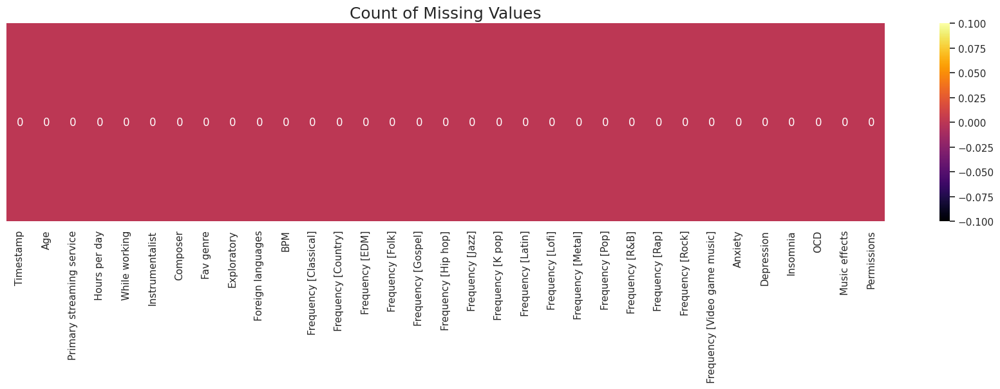

In [29]:
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='inferno', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

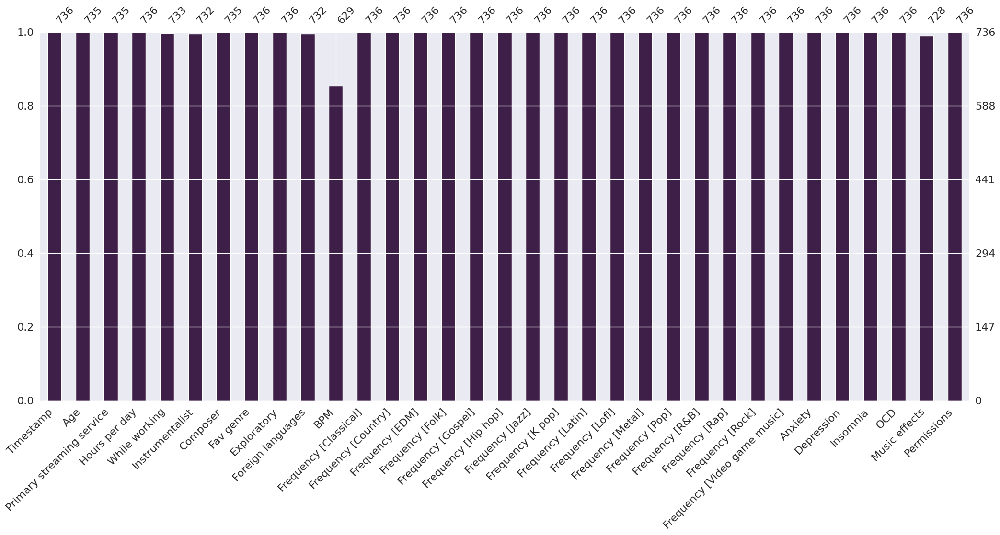

In [8]:
import missingno as msno
msno.bar(df, color='#3E1F47')
plt.show()

In [9]:
df[df['Age'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
12,8/27/2022 23:04:00,NaN,Spotify,3.0,Yes,No,No,Hip hop,Yes,Yes,...,Sometimes,Rarely,Rarely,Never,9.0,3.0,2.0,7.0,Improve,I understand.


In [10]:
df[df['Primary streaming service'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
197,8/28/2022 20:50:37,21.0,NaN,5.0,Yes,No,No,Country,Yes,No,...,Never,Rarely,Very frequently,Never,9.0,8.0,9.0,7.0,Improve,I understand.


In [11]:
df[df['Instrumentalist'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
223,8/28/2022 22:06:46,18.0,YouTube Music,12.0,Yes,NaN,No,K pop,Yes,Yes,...,Sometimes,Sometimes,Rarely,Never,3.0,7.0,5.0,2.0,Improve,I understand.
408,8/29/2022 23:36:14,13.0,YouTube Music,3.0,Yes,NaN,Yes,Classical,No,No,...,Never,Never,Never,Never,8.0,7.0,9.0,2.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.
572,9/4/2022 21:29:06,18.0,Spotify,3.0,Yes,NaN,No,Video game music,Yes,Yes,...,Sometimes,Never,Never,Very frequently,7.0,0.0,3.0,1.0,No effect,I understand.


In [12]:
df[df['Composer'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [13]:
df[df['Foreign languages'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
235,8/28/2022 22:39:58,31.0,Spotify,2.0,No,Yes,No,Metal,Yes,NaN,...,Rarely,Sometimes,Very frequently,Sometimes,7.0,6.0,6.0,5.0,Improve,I understand.
396,8/29/2022 20:03:04,14.0,YouTube Music,1.5,No,Yes,No,Classical,Yes,NaN,...,Never,Never,Rarely,Sometimes,1.0,2.0,4.0,3.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.
666,9/15/2022 0:33:58,15.0,Spotify,3.0,Yes,Yes,No,Rock,No,NaN,...,Never,Never,Very frequently,Rarely,4.0,3.0,5.0,0.0,No effect,I understand.


In [14]:
df[df['BPM'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
10,8/27/2022 22:51:15,18.0,Spotify,3.0,Yes,Yes,No,Country,Yes,No,...,Rarely,Never,Rarely,Never,7.0,7.0,4.0,7.0,No effect,I understand.
12,8/27/2022 23:04:00,NaN,Spotify,3.0,Yes,No,No,Hip hop,Yes,Yes,...,Sometimes,Rarely,Rarely,Never,9.0,3.0,2.0,7.0,Improve,I understand.
15,8/27/2022 23:19:52,17.0,Spotify,2.0,No,No,No,Pop,Yes,Yes,...,Rarely,Sometimes,Sometimes,Rarely,7.0,5.0,4.0,1.0,Worsen,I understand.
30,8/28/2022 10:30:22,20.0,Apple Music,5.0,Yes,Yes,No,Rock,Yes,Yes,...,Sometimes,Sometimes,Very frequently,Rarely,7.0,7.0,2.0,0.0,Improve,I understand.
32,8/28/2022 10:54:30,19.0,Spotify,6.0,Yes,Yes,No,Metal,Yes,Yes,...,Never,Never,Sometimes,Sometimes,9.0,8.0,2.0,3.0,Improve,I understand.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
688,9/24/2022 0:42:39,18.0,Spotify,4.0,Yes,No,No,R&B,No,No,...,Very frequently,Sometimes,Never,Never,8.0,0.0,0.0,2.0,No effect,I understand.
700,10/3/2022 10:00:01,20.0,YouTube Music,1.0,Yes,No,No,Pop,No,Yes,...,Rarely,Sometimes,Rarely,Very frequently,8.0,9.0,6.0,5.0,Worsen,I understand.
706,10/3/2022 15:38:19,23.0,Spotify,1.0,Yes,Yes,No,Rock,Yes,Yes,...,Sometimes,Sometimes,Very frequently,Very frequently,8.0,6.0,1.0,4.0,Improve,I understand.
712,10/4/2022 8:53:39,23.0,I do not use a streaming service.,3.0,Yes,No,No,Rock,No,No,...,Rarely,Never,Very frequently,Never,10.0,5.0,2.0,0.0,Improve,I understand.


In [15]:
df[df['While working'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
57,8/28/2022 13:08:24,42.0,I do not use a streaming service.,0.0,NaN,No,No,Rock,No,Yes,...,Rarely,Never,Sometimes,Sometimes,9.0,0.0,10.0,0.0,No effect,I understand.
426,8/30/2022 16:47:39,30.0,Spotify,13.0,NaN,No,No,K pop,Yes,Yes,...,Very frequently,Sometimes,Very frequently,Sometimes,10.0,10.0,10.0,7.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [16]:
df[df['Music effects'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
161,8/28/2022 18:59:40,18.0,Other streaming service,2.0,Yes,No,No,K pop,No,Yes,...,Sometimes,Never,Never,Never,0.0,2.0,0.0,0.0,NaN,I understand.
168,8/28/2022 19:16:43,19.0,Spotify,3.0,Yes,Yes,No,K pop,Yes,Yes,...,Sometimes,Rarely,Sometimes,Sometimes,8.0,9.0,6.0,0.0,NaN,I understand.
338,8/29/2022 8:28:46,21.0,YouTube Music,2.0,Yes,No,No,EDM,No,Yes,...,Rarely,Rarely,Sometimes,Very frequently,10.0,10.0,5.0,7.0,NaN,I understand.
441,8/31/2022 18:56:31,21.0,Apple Music,1.5,Yes,Yes,No,Folk,No,No,...,Never,Never,Sometimes,Never,3.0,3.0,1.0,0.0,NaN,I understand.
532,9/2/2022 19:20:33,67.0,I do not use a streaming service.,1.0,No,No,No,Rock,No,No,...,Sometimes,Sometimes,Sometimes,Never,3.0,2.0,2.0,2.0,NaN,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [17]:
# Remove columns whose null values are less than 10
df.dropna(subset=['Age','Primary streaming service','While working','Instrumentalist','Composer','Foreign languages','Music effects'],inplace=True)

In [18]:
# Since BPM has a lot of null values, we can replace them with the median value
df[df.columns[df.isnull().any()]].isnull().sum()

BPM    102
dtype: int64

In [19]:
df['BPM']=df['BPM'].fillna(df['BPM'].median())

In [28]:
df.describe()[1:].T.style.background_gradient(cmap='inferno', axis=1)

,mean,std,min,25%,50%,75%,max
Age,25.176880,11.953918,10.000000,18.000000,21.000000,28.000000,89.000000
Hours per day,3.578064,3.017779,0.000000,2.000000,3.000000,5.000000,24.000000
BPM,1392880.558496,37319663.912828,0.000000,105.000000,120.000000,140.000000,999999999.000000
Anxiety,5.837744,2.784533,0.000000,4.000000,6.000000,8.000000,10.000000
Depression,4.806407,3.020061,0.000000,2.000000,5.000000,7.000000,10.000000
Insomnia,3.717967,3.084387,0.000000,1.000000,3.000000,6.000000,10.000000
OCD,2.635097,2.844382,0.000000,0.000000,2.000000,4.000000,10.000000


In [21]:
# finding unique data
df.apply(lambda x: len(x.unique()))

Timestamp                       717
Age                              61
Primary streaming service         6
Hours per day                    26
While working                     2
Instrumentalist                   2
Composer                          2
Fav genre                        16
Exploratory                       2
Foreign languages                 2
BPM                             135
Frequency [Classical]             4
Frequency [Country]               4
Frequency [EDM]                   4
Frequency [Folk]                  4
Frequency [Gospel]                4
Frequency [Hip hop]               4
Frequency [Jazz]                  4
Frequency [K pop]                 4
Frequency [Latin]                 4
Frequency [Lofi]                  4
Frequency [Metal]                 4
Frequency [Pop]                   4
Frequency [R&B]                   4
Frequency [Rap]                   4
Frequency [Rock]                  4
Frequency [Video game music]      4
Anxiety                     

In [22]:
unique = df.nunique().sort_values()
unique_values = df.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
Age,61,"[18.0, 61.0, 21.0, 19.0, 17.0, 16.0, 15.0, 14...."
Anxiety,12,"[7.0, 9.0, 8.0, 4.0, 5.0, 2.0, 1.0, 6.0, 10.0,..."
BPM,135,"[132.0, 84.0, 107.0, 86.0, 66.0, 95.0, 94.0, 1..."
Composer,2,"[No, Yes]"
Depression,12,"[7.0, 2.0, 8.0, 3.0, 0.0, 1.0, 4.0, 5.0, 9.0, ..."
Exploratory,2,"[No, Yes]"
Fav genre,16,"[Video game music, Jazz, R&B, K pop, Rock, Cou..."
Foreign languages,2,"[Yes, No]"
Frequency [Classical],4,"[Never, Sometimes, Rarely, Very frequently]"
Frequency [Country],4,"[Never, Sometimes, Very frequently, Rarely]"


In [24]:
ProfileReport(df, title='Report', minimal=True, progress_bar=False, samples=None, correlations=None, interactions=None, explorative=True, dark_mode=True, notebook={'iframe':{'height': '600px'}}, html={'style':{'primary_color': '#393701'}}, missing_diagrams={'heatmap': False, 'dendrogram': False}).to_notebook_iframe()

In [25]:
df1 = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']

In [27]:
df[df1].corr().T.style.background_gradient(cmap='inferno', axis=1)

,Age,Hours per day,BPM,Anxiety,Depression,Insomnia,OCD
Age,1.000000,-0.038877,-0.028690,-0.187165,-0.117034,0.009015,-0.132764
Hours per day,-0.038877,1.000000,0.042377,0.045476,0.097259,0.135493,0.113584
BPM,-0.028690,0.042377,1.000000,-0.024665,0.039519,0.051883,0.017933
Anxiety,-0.187165,0.045476,-0.024665,1.000000,0.520923,0.282420,0.343774
Depression,-0.117034,0.097259,0.039519,0.520923,1.000000,0.376118,0.186718
Insomnia,0.009015,0.135493,0.051883,0.282420,0.376118,1.000000,0.224368
OCD,-0.132764,0.113584,0.017933,0.343774,0.186718,0.224368,1.000000


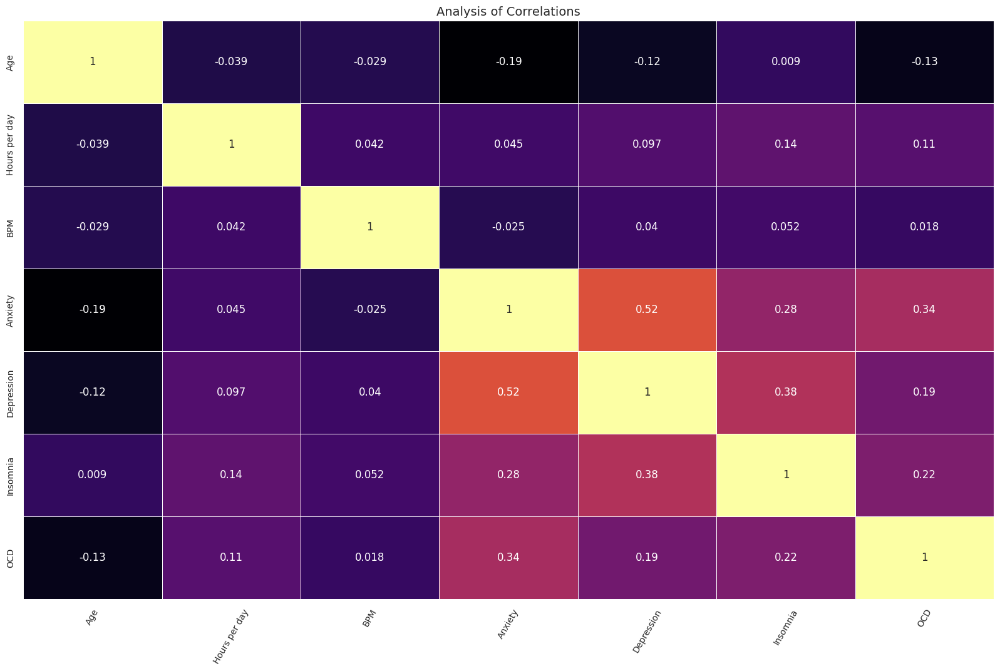

In [30]:
def correlated_map(dataframe, plot=False):
    corr = df[df1].corr()
    if plot:
        sns.set(rc={'figure.figsize': (20, 12)})
        sns.heatmap(corr, cmap="inferno", annot=True, linewidths=.6 , cbar = False)
        plt.xticks(rotation=60, size=10)
        plt.yticks(size=10)
        plt.title('Analysis of Correlations', size=14)
        plt.show()
correlated_map(df, plot=True)

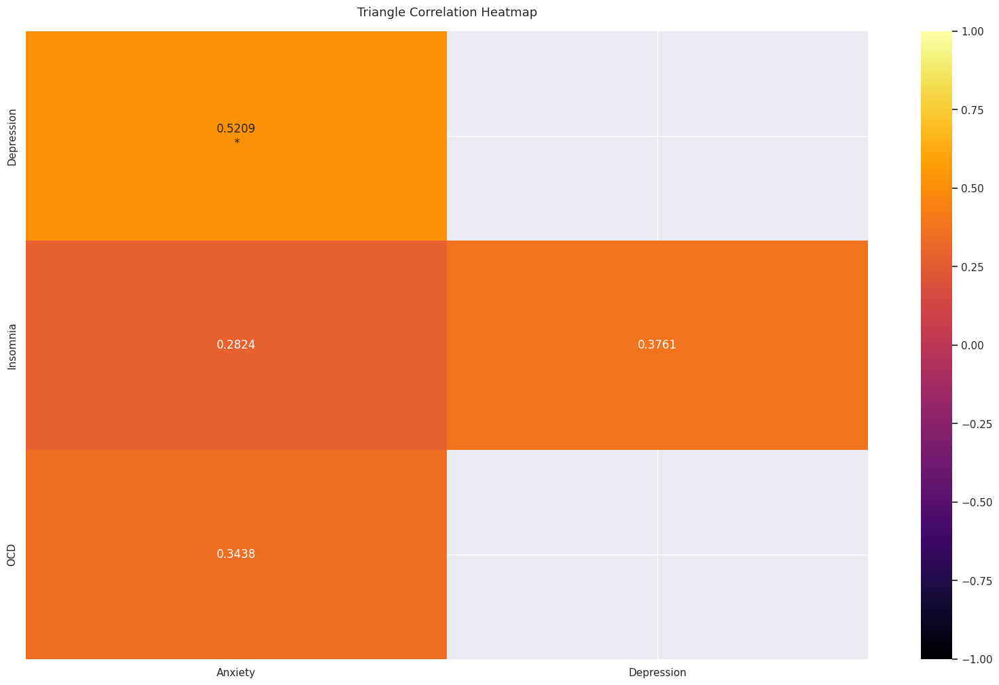

In [32]:
corr = df[df1].corr()
f, ax = plt.subplots(figsize=(20, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
          for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='inferno')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 13}, pad=16)
plt.show()

Here; Anxiety, Depression, OCD, and Insomina are positively correlated. Other numerical variables are not correlated, indicating no linear relationship.

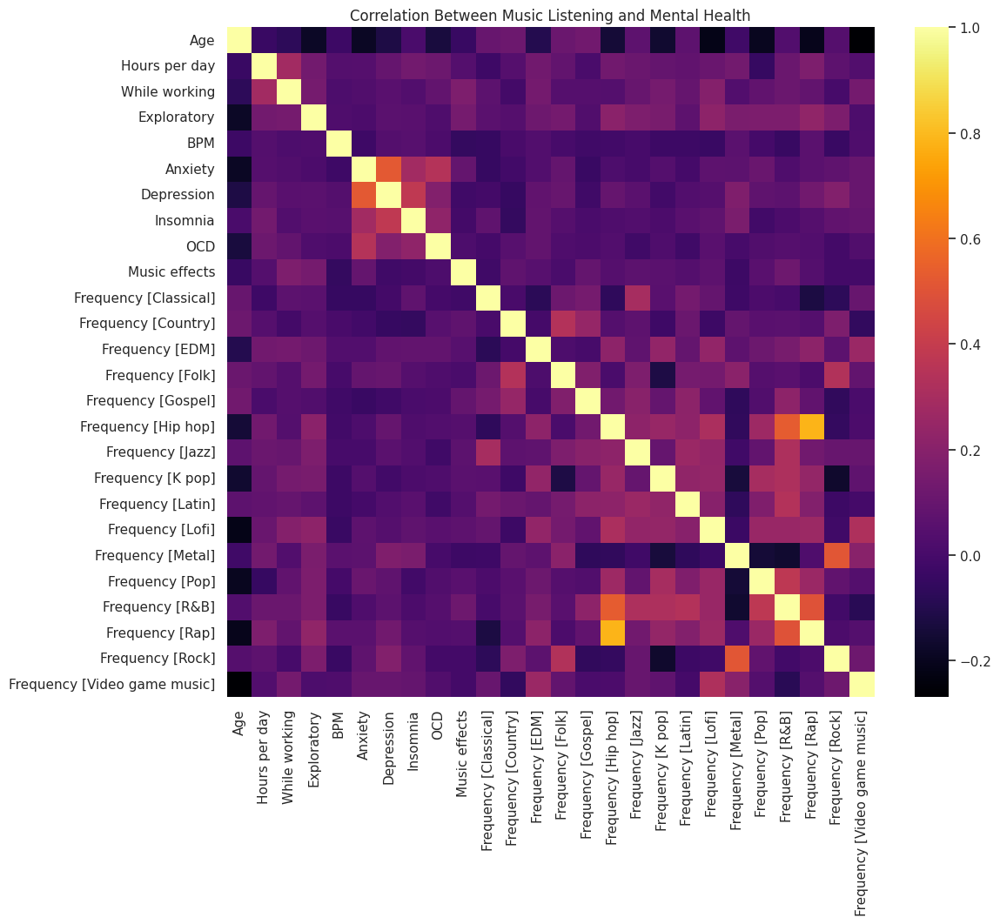

In [34]:
sel = ['Age', 'Hours per day', 'While working', 'Exploratory', 'BPM','Anxiety', 'Depression', 'Insomnia', 'OCD', 'Music effects']
freq = {'Never': 0, 'Rarely': 1, 'Sometimes': 2, 'Very frequently': 3}
df_genre = df[[col for col in df.columns if col.startswith('Frequency')]]
df_genre.replace(freq, inplace=True)
df_sel = pd.concat([df[sel], df_genre], axis=1)
df_sel['While working'] = df_sel['While working'].map({'Yes': 1, 'No': 0})
df_sel['Exploratory'] = df_sel['Exploratory'].map({'Yes': 1, 'No': 0})
df_sel['Music effects'] = df_sel['Music effects'].map({'Improve': 1, 'No effect': 0, 'Worsen': -1})
plt.figure(figsize=(12, 10))
sns.heatmap(df_sel.corr(), annot=False, cmap='inferno')
plt.title('Correlation Between Music Listening and Mental Health')
plt.show()

- This heatmap doesn't give us clear insights into which features significantly improve mental health according to the listeners. However, it does show some cool connections between music genres

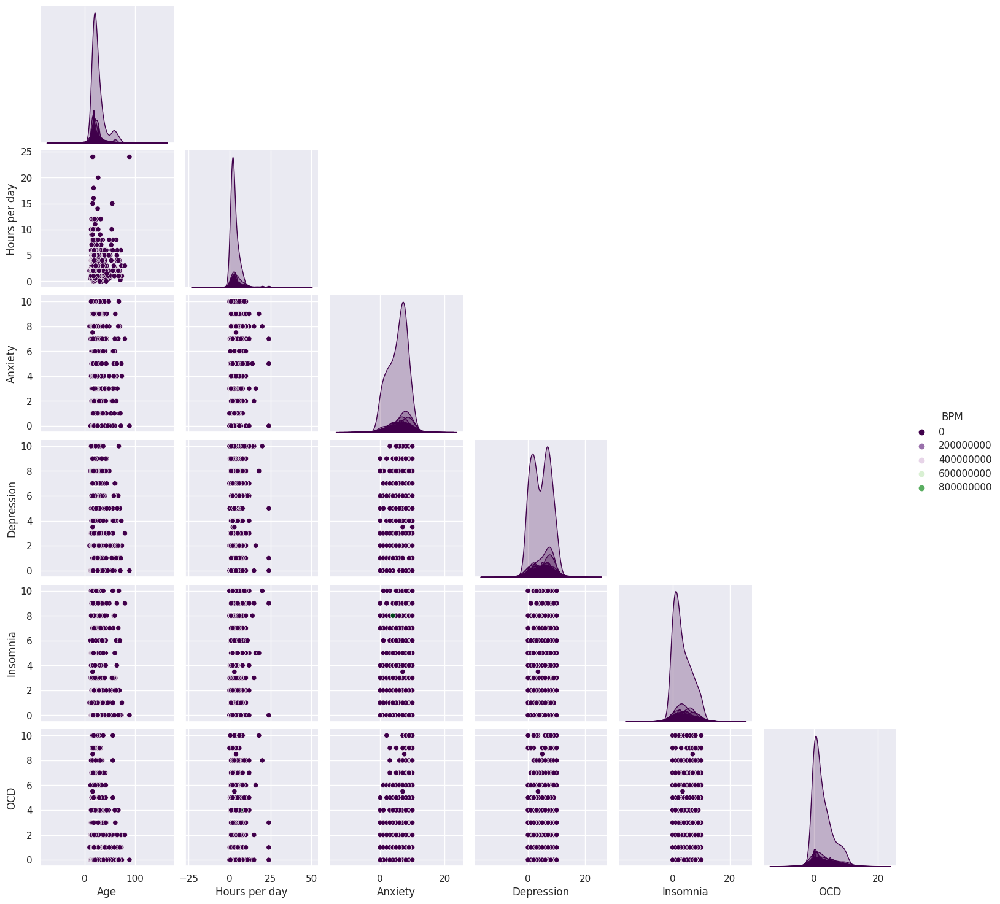

In [37]:
sns.pairplot(data=df[df1], diag_kind='kde',hue="BPM",palette='PRGn',corner=True)
plt.show()

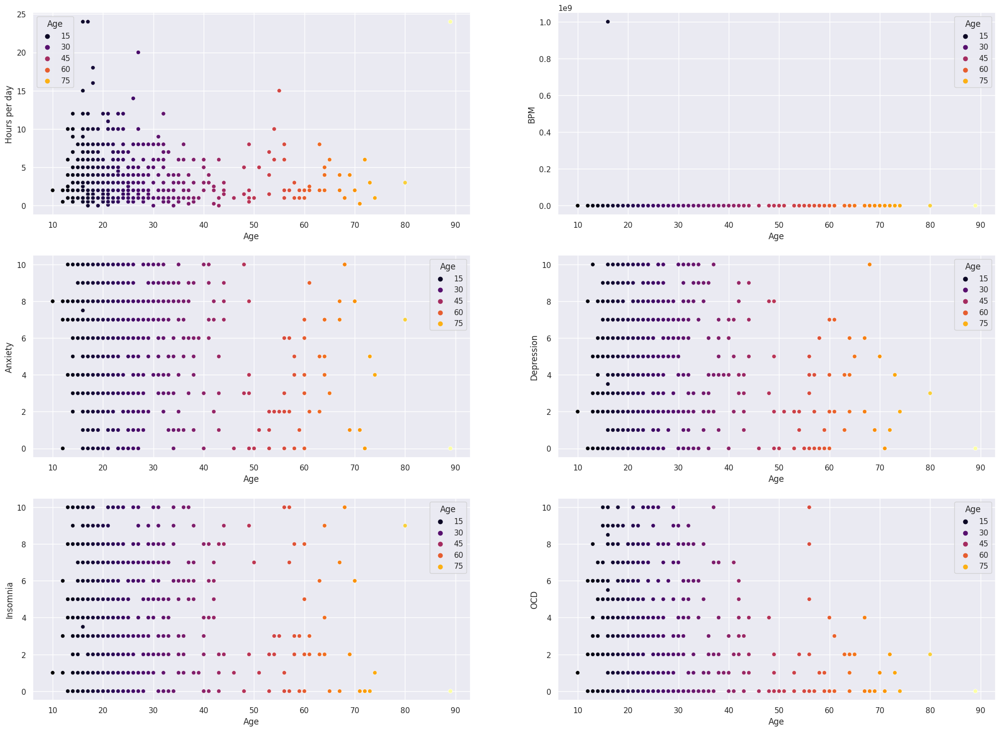

In [38]:
ff = ['Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Age',y=col,hue='Age',data=df,palette="inferno")

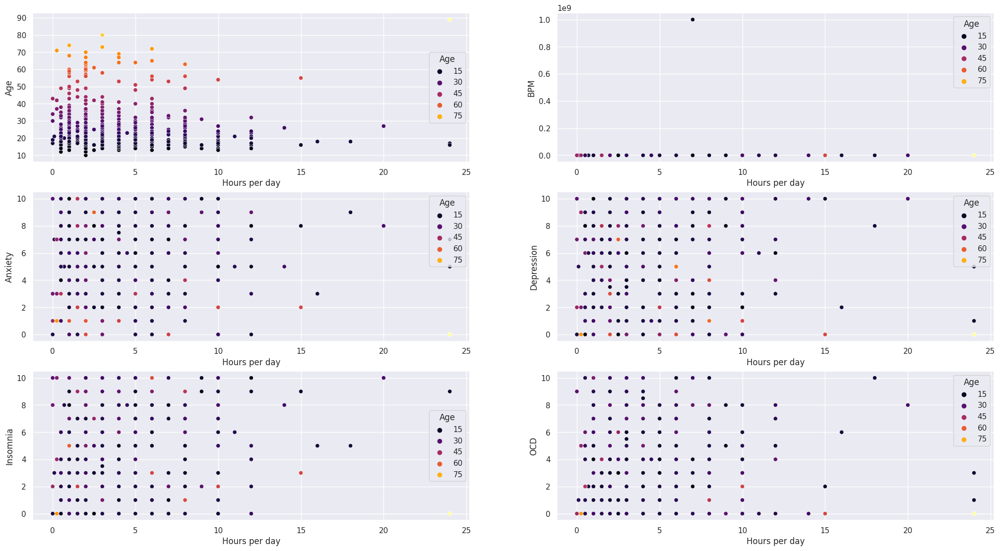

In [39]:
ff = ['Age','BPM','Anxiety','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(4,2,i+1)
    sns.scatterplot(x='Hours per day',y=col,hue='Age',data=df,palette="inferno")

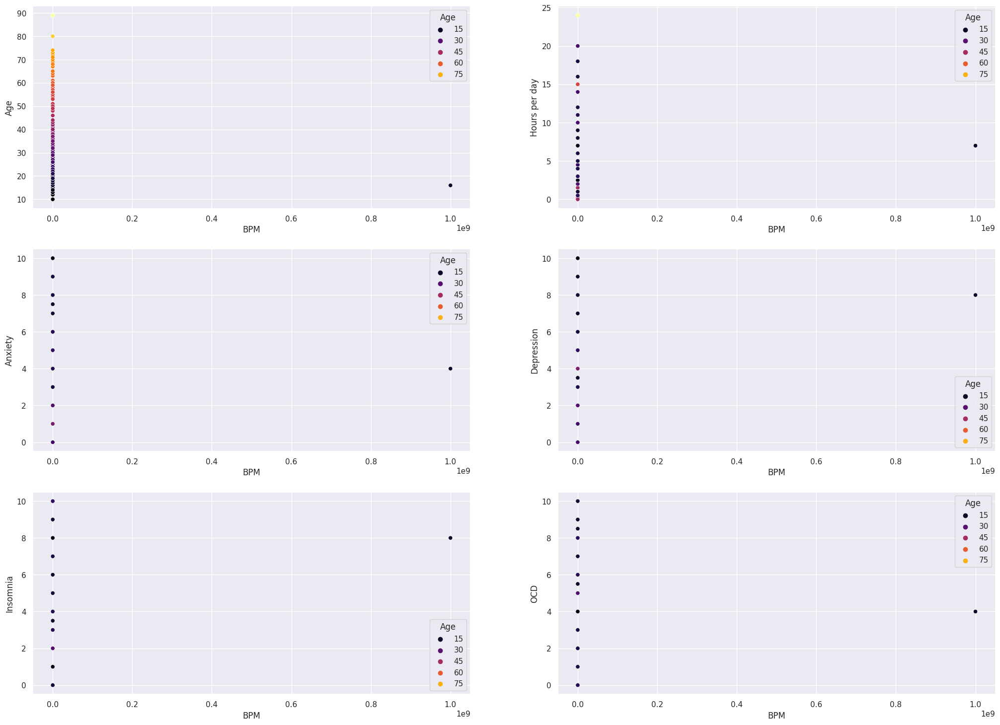

In [40]:
ff = ['Age','Hours per day','Anxiety','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='BPM',y=col,hue='Age',data=df,palette="inferno")

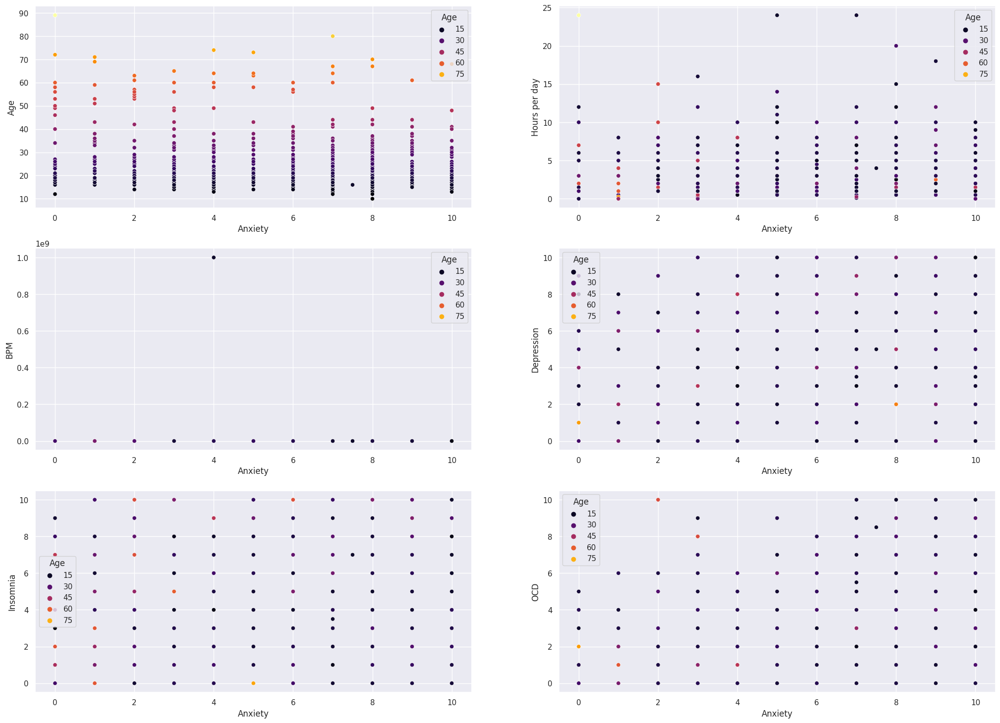

In [41]:
ff = ['Age','Hours per day','BPM','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Anxiety',y=col,hue='Age',data=df,palette="inferno")

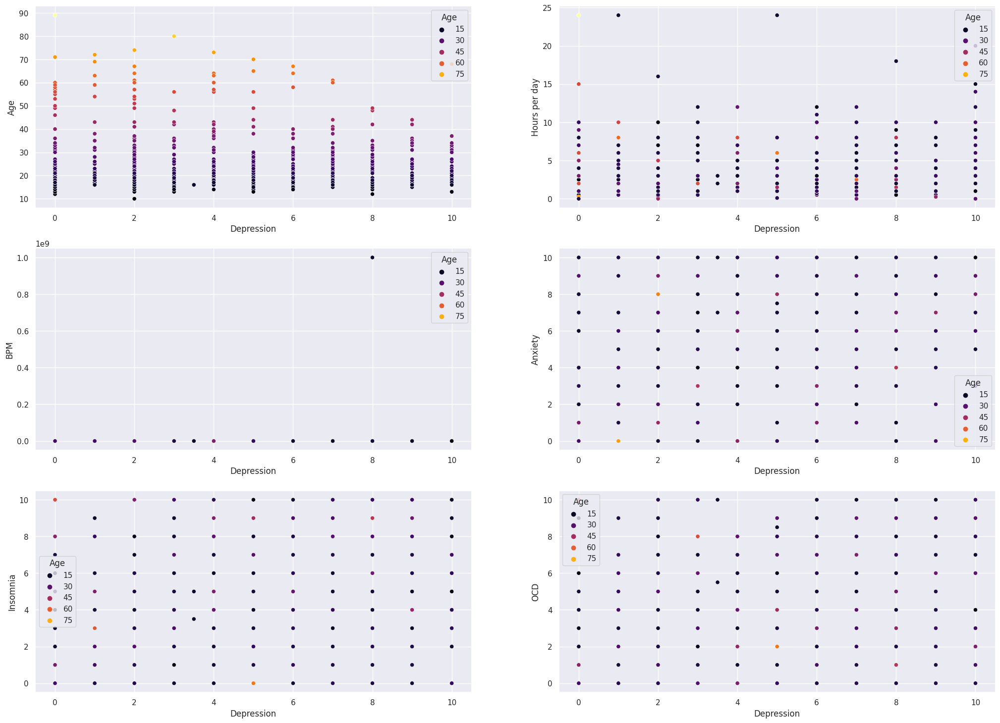

In [42]:
ff = ['Age','Hours per day','BPM','Anxiety','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Depression',y=col,hue='Age',data=df,palette="inferno")

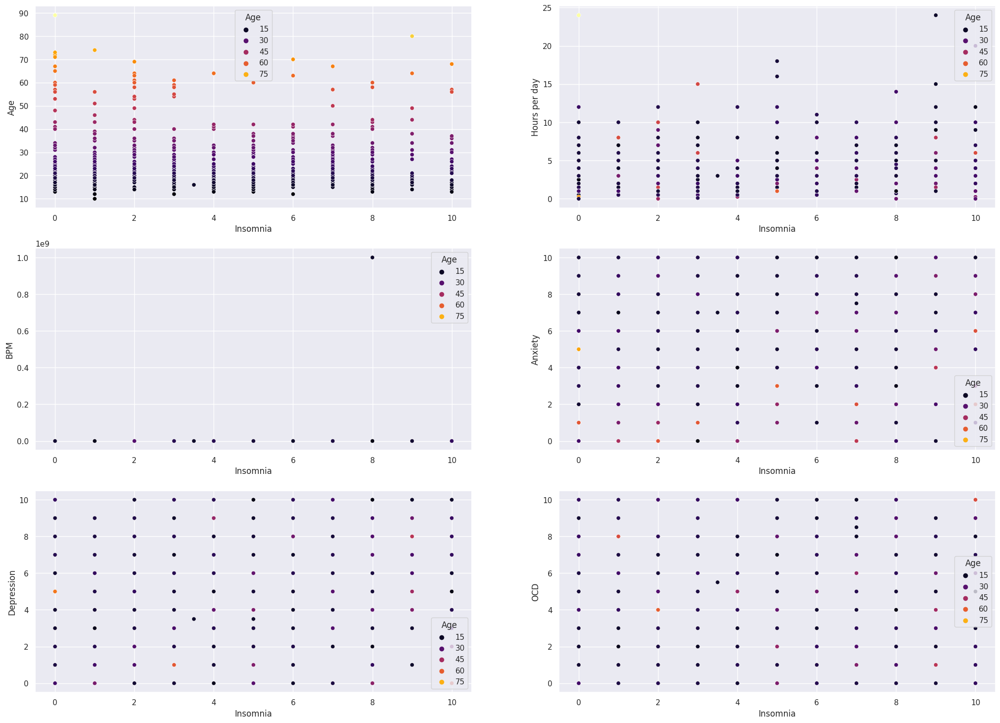

In [43]:
ff = ['Age','Hours per day','BPM','Anxiety','Depression','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Insomnia',y=col,hue='Age',data=df,palette="inferno")

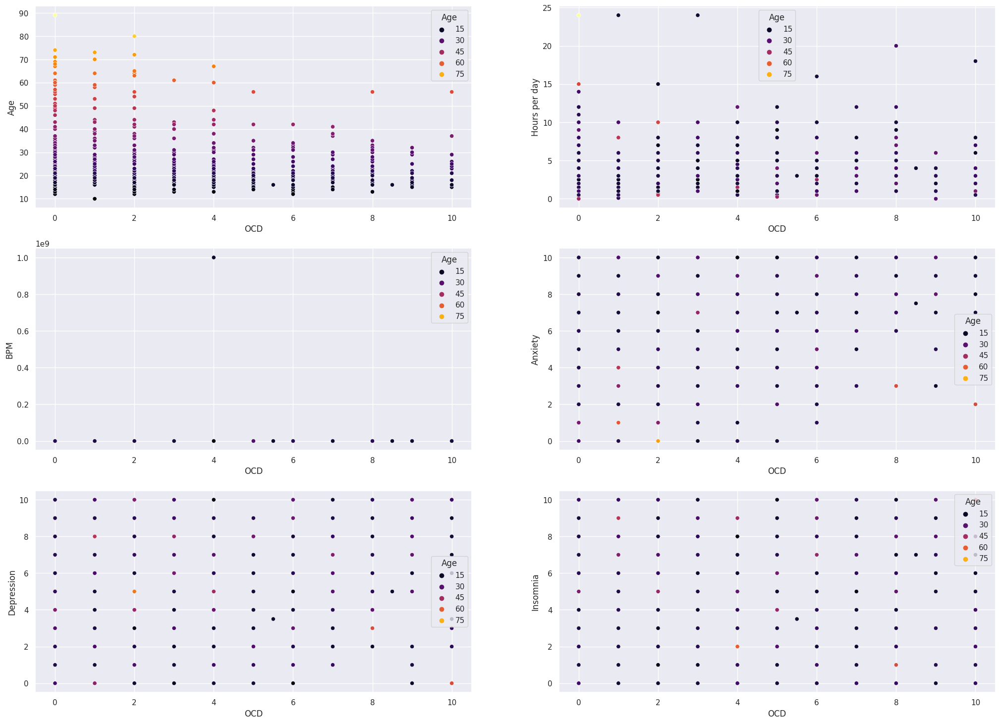

In [44]:
ff = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='OCD',y=col,hue='Age',data=df,palette="inferno")

In [51]:
fig = px.scatter_3d(df, x='Insomnia', y='Anxiety', z='Depression', color='Age', color_continuous_scale="PRGn", template = 'plotly_white')
fig.update_traces(marker=dict(size=5))
fig.show()

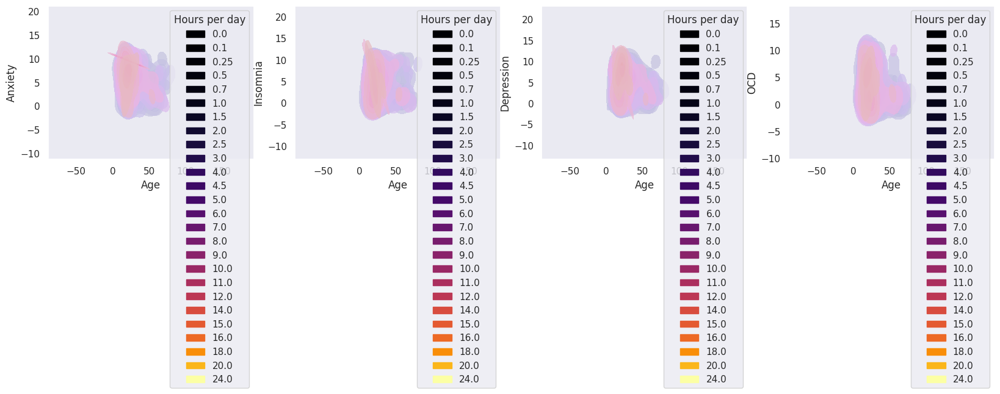

In [52]:
warnings.filterwarnings("ignore")
plt.figure(figsize=(20,15))
plt.subplot(4,4,1)
sns.kdeplot(data=df[df1],x='Age', y='Anxiety', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='inferno')
plt.grid()
plt.subplot(4,4,2)
sns.kdeplot(data=df[df1],x='Age', y='Insomnia', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='inferno')
plt.grid()
plt.subplot(4,4,3)
sns.kdeplot(data=df[df1],x='Age', y='Depression', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='inferno')
plt.grid()
plt.subplot(4,4,4)
sns.kdeplot(data=df[df1],x='Age', y='OCD', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='inferno')
plt.grid()

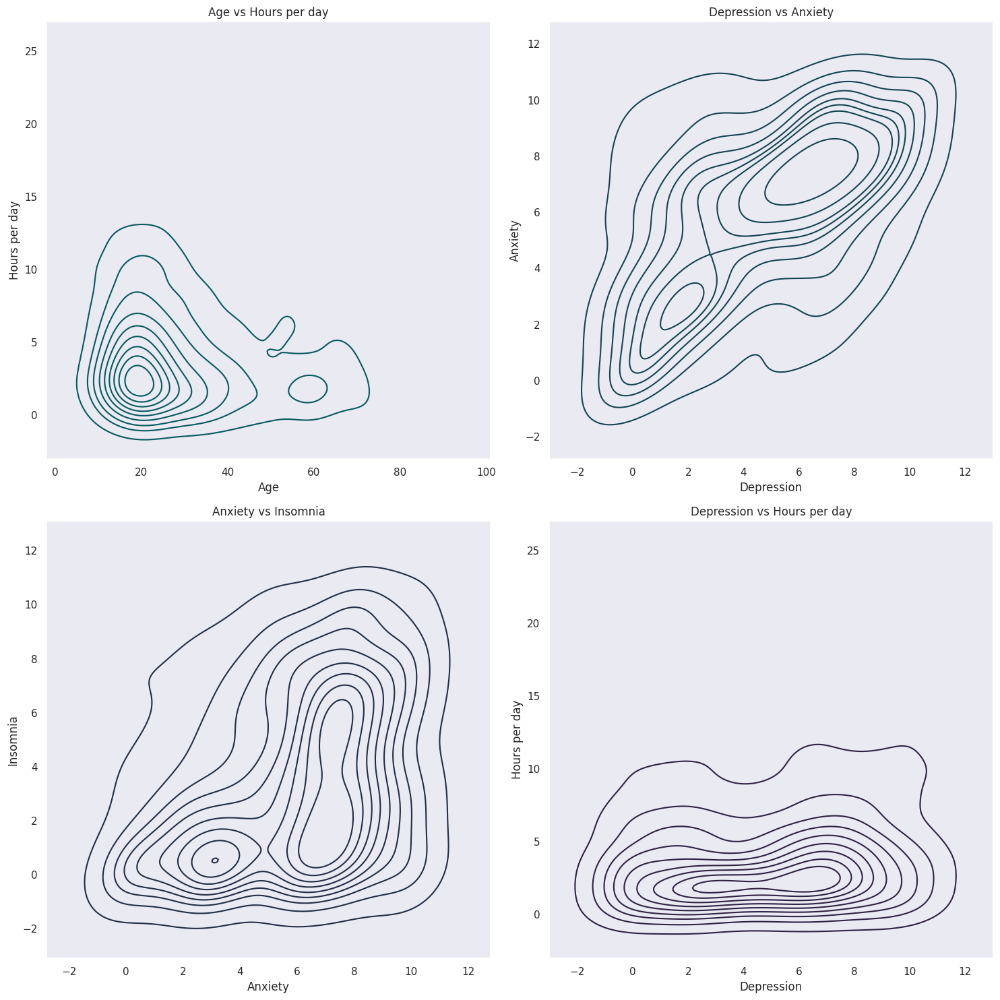

In [53]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
sns.kdeplot(x='Age', y='Hours per day', data=df, ax=axs[0, 0], color='#065A60')
axs[0, 0].set_title('Age vs Hours per day')
axs[0, 0].grid()
sns.kdeplot(x='Depression', y='Anxiety', data=df, ax=axs[0, 1], color='#144552')
axs[0, 1].set_title('Depression vs Anxiety')
axs[0, 1].grid()
sns.kdeplot(x='Anxiety', y='Insomnia', data=df, ax=axs[1, 0], color='#212F45')
axs[1, 0].set_title('Anxiety vs Insomnia')
axs[1, 0].grid()
sns.kdeplot(x='Depression', y='Hours per day', data=df, ax=axs[1, 1], color='#312244')
axs[1, 1].set_title('Depression vs Hours per day')
axs[1, 1].grid()
plt.tight_layout()
plt.show()

- Densities are visible. These plots show that young people spend more time on music.

<Axes: xlabel='OCD', ylabel='Density'>

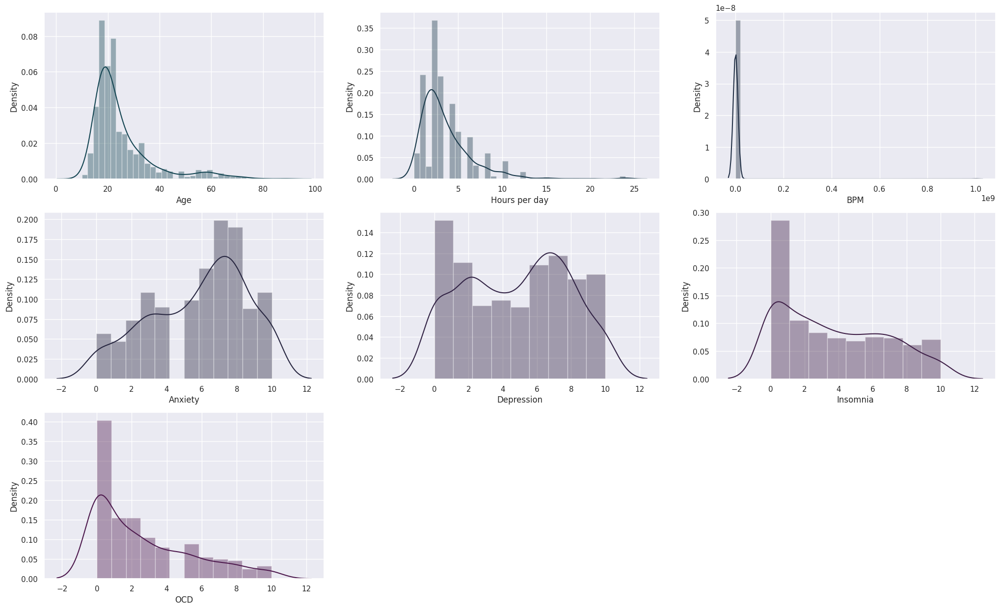

In [54]:
warnings.filterwarnings("ignore")
plt.figure(figsize=(25,15))
plt.subplot(3,3,1)
sns.distplot(df['Age'],kde=True,color='#144552')
plt.subplot(3,3,2)
sns.distplot(df['Hours per day'],kde=True,color='#1B3A4B')
plt.subplot(3,3,3)
sns.distplot(df['BPM'],kde=True,color='#212F45')
plt.subplot(3,3,4)
sns.distplot(df['Anxiety'],kde=True,color='#272640')
plt.subplot(3,3,5)
sns.distplot(df['Depression'],kde=True,color='#312244')
plt.subplot(3,3,6)
sns.distplot(df['Insomnia'],kde=True,color='#3E1F47')
plt.subplot(3,3,7)
sns.distplot(df['OCD'],kde=True,color='#4D194D')

In [55]:
# measure of skewness
df[df1].skew(axis = 0, skipna = True) 

Age               2.135697
Hours per day     2.550819
BPM              26.795522
Anxiety          -0.426211
Depression       -0.059075
Insomnia          0.415499
OCD               0.963606
dtype: float64

In [57]:
print('Records that consist of +12 hours listening to music:\n')
print(f'{len(df[df["Hours per day"] > 12])} records')
print("{:.2f}% of data".format((len(df[df['Hours per day'] > 12]) / data.shape[0]) * 100))

Records that consist of +12 hours listening to music:

9 records
1.22% of data


In [58]:
outre = df.query('`Hours per day` > 12')
outre

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
18,8/27/2022 23:40:55,17.0,Spotify,24.0,Yes,No,No,Rap,Yes,No,...,Sometimes,Very frequently,Very frequently,Never,7.0,5.0,0.0,3.0,Improve,I understand.
290,8/29/2022 2:46:27,27.0,Spotify,20.0,Yes,No,No,Rock,Yes,Yes,...,Never,Rarely,Very frequently,Sometimes,8.0,10.0,10.0,8.0,No effect,I understand.
347,8/29/2022 9:42:23,18.0,Spotify,16.0,Yes,No,Yes,Jazz,Yes,Yes,...,Very frequently,Very frequently,Very frequently,Rarely,3.0,2.0,5.0,6.0,Improve,I understand.
359,8/29/2022 11:02:29,16.0,Spotify,15.0,Yes,Yes,Yes,EDM,Yes,No,...,Never,Very frequently,Very frequently,Sometimes,8.0,10.0,9.0,2.0,Improve,I understand.
366,8/29/2022 12:32:30,16.0,Spotify,24.0,Yes,No,No,Rock,Yes,Yes,...,Rarely,Rarely,Sometimes,Rarely,5.0,1.0,9.0,1.0,Improve,I understand.
407,8/29/2022 23:20:48,26.0,Spotify,14.0,Yes,No,No,Hip hop,Yes,Yes,...,Very frequently,Very frequently,Very frequently,Rarely,5.0,10.0,8.0,0.0,No effect,I understand.
485,9/1/2022 19:08:55,55.0,YouTube Music,15.0,Yes,No,No,Rock,No,No,...,Never,Never,Very frequently,Never,2.0,0.0,3.0,0.0,No effect,I understand.
695,9/28/2022 17:25:48,89.0,Spotify,24.0,Yes,Yes,Yes,Rap,No,No,...,Sometimes,Very frequently,Rarely,Never,0.0,0.0,0.0,0.0,No effect,I understand.
726,10/23/2022 20:50:27,18.0,Apple Music,18.0,Yes,No,No,EDM,Yes,No,...,Sometimes,Sometimes,Sometimes,Sometimes,9.0,8.0,5.0,10.0,Improve,I understand.


In [59]:
anx = data.query('`Hours per day` < 12')['Anxiety'].mean()
dep = data.query('`Hours per day` < 12')['Depression'].mean()
ins = data.query('`Hours per day` < 12')['Insomnia'].mean()
ocd = data.query('`Hours per day` < 12')['OCD'].mean()
anx1 = outre['Anxiety'].mean()
dep1 = outre['Depression'].mean()
ins1 = outre['Insomnia'].mean()
ocd1 = outre['OCD'].mean()

In [61]:
print('Records that consist +180 BPM:\n')
print(f'{len(df[df["BPM"] > 180])} records')
print("{:.2f}% of df".format((len(df[df['BPM'] > 180]) / df.shape[0]) * 100))

Records that consist +180 BPM:

28 records
3.90% of df


In [62]:
outre2 = (df.query('BPM > 180')[
        ['Age', 'Primary streaming service', 'Hours per day', 'Instrumentalist', 
        'Fav genre','Exploratory', 'BPM','Anxiety', 'Depression','Insomnia', 
        'OCD', 'Music effects']].reset_index().drop(columns='index'))
outre2

,Age,Primary streaming service,Hours per day,Instrumentalist,Fav genre,Exploratory,BPM,Anxiety,Depression,Insomnia,OCD,Music effects
0,17.0,Apple Music,1.0,No,Pop,Yes,183.0,8.0,2.0,1.0,5.0,Improve
1,22.0,Spotify,10.0,No,Metal,Yes,189.0,9.0,6.0,0.0,6.0,Improve
2,31.0,Spotify,2.0,No,Rock,Yes,200.0,8.0,9.0,6.0,2.0,Improve
3,15.0,Spotify,8.0,No,Rock,No,193.0,8.0,7.0,5.0,0.0,Improve
4,29.0,Other streaming service,5.0,No,Jazz,Yes,200.0,7.0,2.0,3.0,1.0,Improve
5,27.0,Spotify,10.0,No,Metal,Yes,185.0,5.0,6.0,6.0,3.0,Improve
6,28.0,I do not use a streaming service.,4.0,No,Rock,Yes,194.0,6.0,8.0,1.0,6.0,Improve
7,18.0,Spotify,1.0,Yes,Metal,Yes,190.0,6.0,9.0,9.0,0.0,Improve
8,27.0,Spotify,10.0,No,Metal,Yes,194.0,8.0,8.0,3.0,0.0,Improve
9,64.0,I do not use a streaming service.,4.0,No,Rock,No,200.0,4.0,4.0,2.0,1.0,Improve


- Some participants may have inaccurately reported the BPM of their favorite music genres, leading to questionable data quality. For instance, genres like metal can vary widely in BPM (beats per minute), such as between 100 to 180 BPM on average. This variability allows for values that are both above and below this range while still being classified as metal. It's possible that participants either guessed at these BPM values or entered random numbers to complete the form, as evidenced by entries like 999999999.

- Examples highlighting this issue include entry 16 in the table, where the participant listed Jazz as their most listened-to genre but at a BPM of 200, well above the typical range of 120-125 BPM for Jazz. Similarly, entry 24 stands out, with a reported BPM of 624 for EDM, which is highly unusual and likely inaccurate.

In [63]:
print('Records that consist +70 Age:\n')
print(f'{len(df[df["Age"] > 70])} records')
print("{:.2f}% of df".format((len(df[df['Age'] > 70]) / df.shape[0]) * 100))

Records that consist +70 Age:

6 records
0.84% of df


In [64]:
outre3 = df.query('Age > 70')
outre3

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
428,8/30/2022 17:43:36,72.0,Spotify,6.00,Yes,Yes,Yes,Rock,No,No,...,Very frequently,Never,Very frequently,Never,0.0,1.0,0.0,2.0,Improve,I understand.
429,8/30/2022 18:15:39,73.0,Pandora,3.00,Yes,No,No,R&B,Yes,Yes,...,Very frequently,Sometimes,Sometimes,Never,5.0,4.0,0.0,1.0,Improve,I understand.
490,9/1/2022 19:44:33,71.0,I do not use a streaming service.,0.25,Yes,No,No,Gospel,No,Yes,...,Rarely,Never,Rarely,Never,1.0,0.0,0.0,0.0,Improve,I understand.
494,9/1/2022 21:07:33,74.0,I do not use a streaming service.,1.00,No,No,No,Pop,No,No,...,Sometimes,Never,Sometimes,Never,4.0,2.0,1.0,0.0,Improve,I understand.
527,9/2/2022 14:09:04,80.0,I do not use a streaming service.,3.00,Yes,Yes,No,Classical,No,No,...,Never,Never,Never,Sometimes,7.0,3.0,9.0,2.0,Improve,I understand.
695,9/28/2022 17:25:48,89.0,Spotify,24.00,Yes,Yes,Yes,Rap,No,No,...,Sometimes,Very frequently,Rarely,Never,0.0,0.0,0.0,0.0,No effect,I understand.


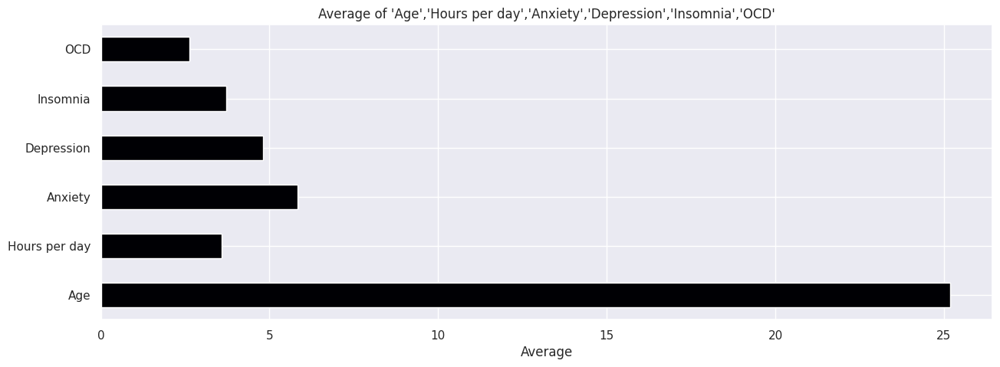

In [65]:
df2 = ['Age','Hours per day','Anxiety','Depression','Insomnia','OCD']
df_mean = df[df2].mean()
df_mean.plot(kind='barh', stacked=True, figsize=(15, 5), cmap="inferno")
plt.xlabel('Average')
plt.title("Average of 'Age','Hours per day','Anxiety','Depression','Insomnia','OCD'")
plt.show()

<Axes: >

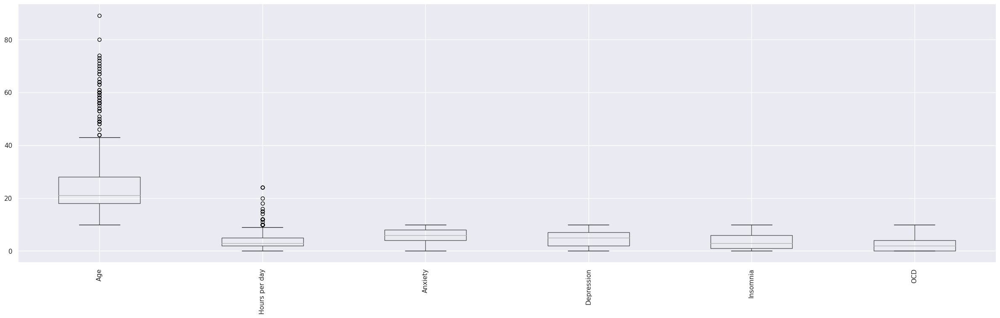

In [66]:
df[df2].boxplot(rot=90 , figsize=(30,8))

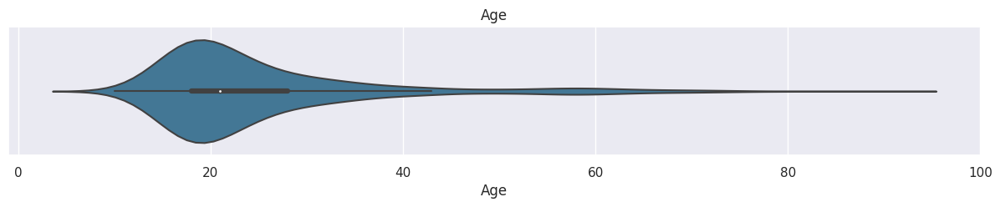

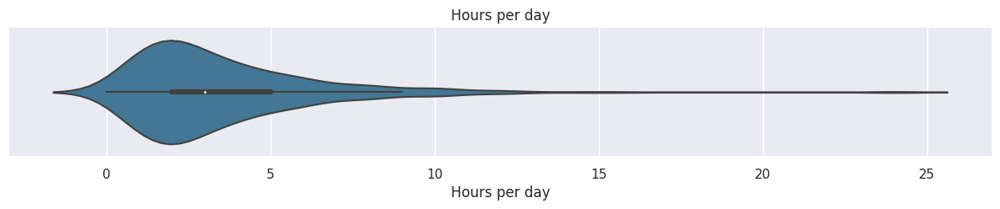

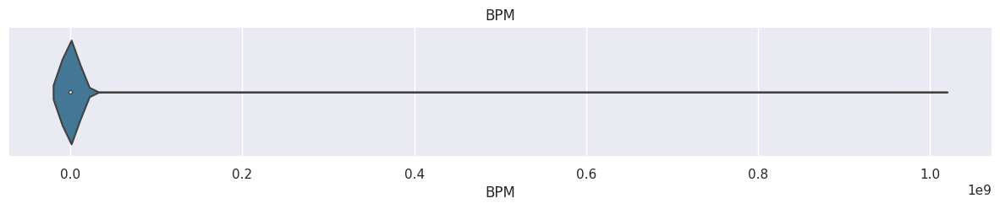

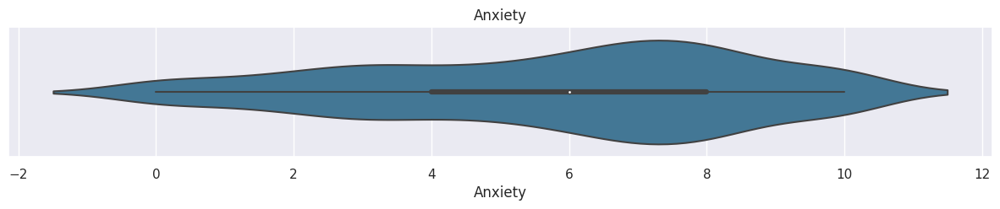

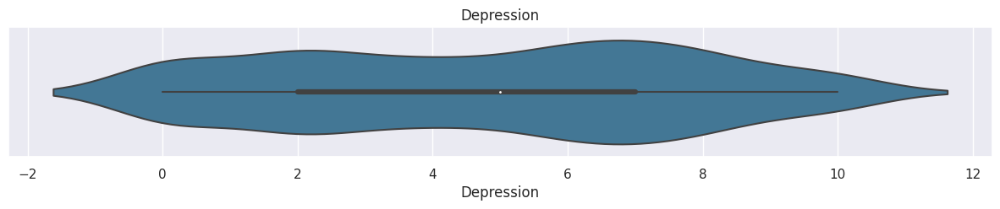

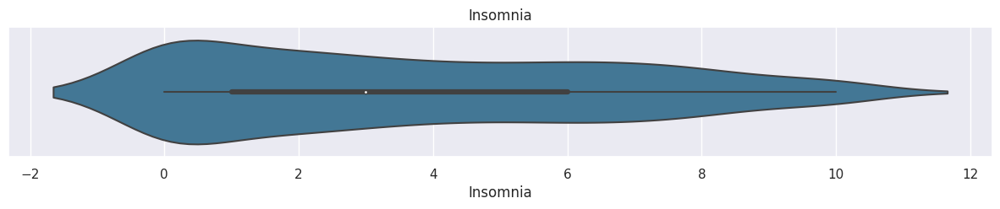

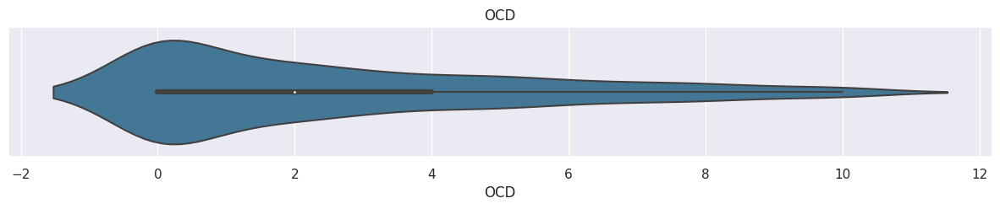

In [67]:
columns1 = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
palette ="inferno"
for column in columns1:
    plt.figure(figsize=(15,2))
    sns.violinplot(x=df[column], palette=palette)
    plt.title(column)
    plt.show()


Age Statistics:
count: 718.00, mean: 25.18, std: 11.95, min: 10.00, 25%: 18.00, 50%: 21.00, 75%: 28.00, max: 89.00


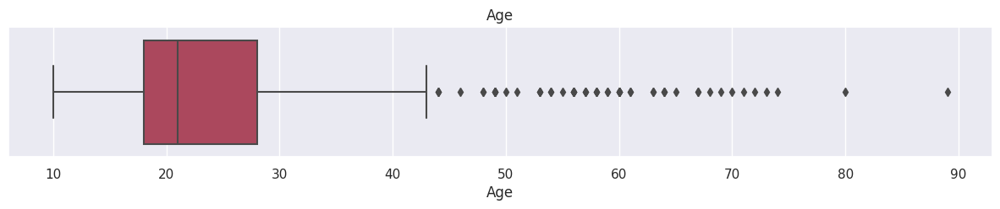


Hours per day Statistics:
count: 718.00, mean: 3.58, std: 3.02, min: 0.00, 25%: 2.00, 50%: 3.00, 75%: 5.00, max: 24.00


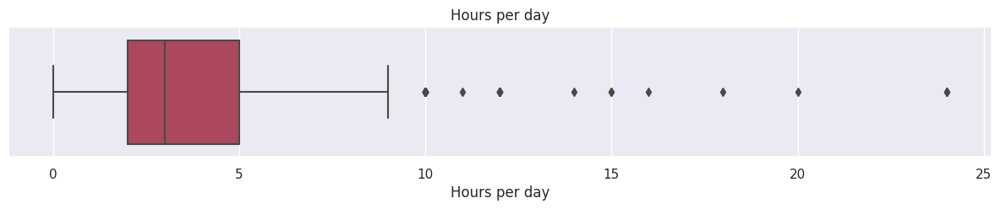


BPM Statistics:
count: 718.00, mean: 1392880.56, std: 37319663.91, min: 0.00, 25%: 105.00, 50%: 120.00, 75%: 140.00, max: 999999999.00


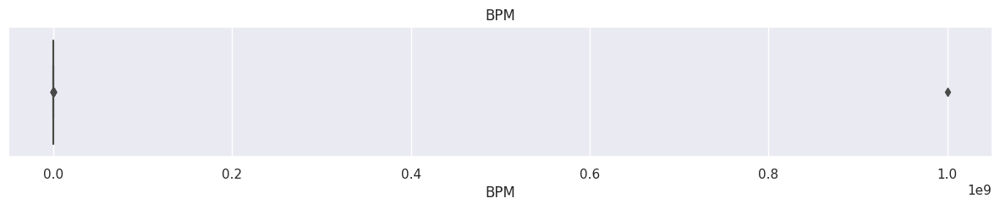


Anxiety Statistics:
count: 718.00, mean: 5.84, std: 2.78, min: 0.00, 25%: 4.00, 50%: 6.00, 75%: 8.00, max: 10.00


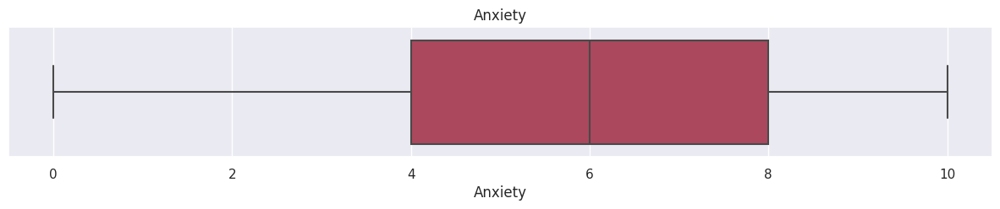


Depression Statistics:
count: 718.00, mean: 4.81, std: 3.02, min: 0.00, 25%: 2.00, 50%: 5.00, 75%: 7.00, max: 10.00


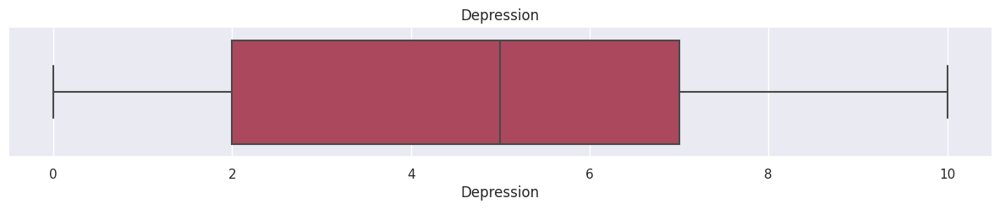


Insomnia Statistics:
count: 718.00, mean: 3.72, std: 3.08, min: 0.00, 25%: 1.00, 50%: 3.00, 75%: 6.00, max: 10.00


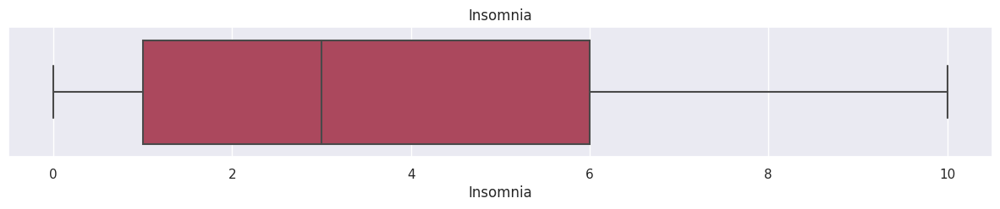


OCD Statistics:
count: 718.00, mean: 2.64, std: 2.84, min: 0.00, 25%: 0.00, 50%: 2.00, 75%: 4.00, max: 10.00


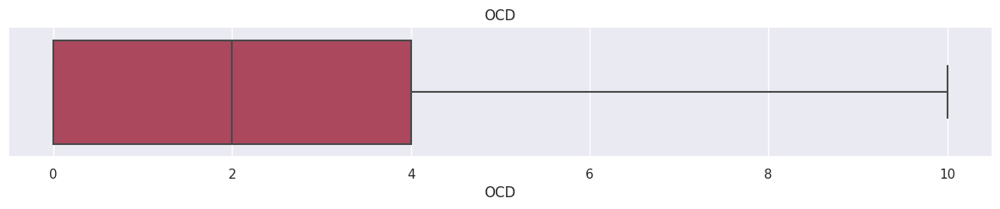

In [68]:
palette ="inferno"
for column in columns1:
    plt.figure(figsize=(15,2))
    sns.boxplot(x=df[column], palette=palette)
    plt.title(column)
    stats = df[column].describe()
    stats_text = ", ".join([f"{key}: {value:.2f}" for key, value in stats.items()])
    print(f"\n{column} Statistics:\n{stats_text}")
    plt.show()

In [69]:
feature_list = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
def StDev_method (df,n,features):
    outliers = []
    for column in features:
        data_mean = df[column].mean()
        data_std = df[column].std()
        cut_off = data_std * 3     
        outlier_list_column = df[(df[column] < data_mean - cut_off) | (df[column] > data_mean + cut_off)].index
        outliers.extend(outlier_list_column)
    outliers = Counter(outliers)        
    OUT= list( k for k, v in outliers.items() if v > n )
    df1 = df[df[column] > data_mean + cut_off]
    df2 = df[df[column] < data_mean - cut_off]
    print('Total number of outliers is:', df1.shape[0]+ df2.shape[0])
    
    return OUT  
Outliers_StDev = StDev_method(df,1,feature_list)
df_out2 = df.drop(Outliers_StDev, axis = 0).reset_index(drop=True)

Total number of outliers is: 0


In [70]:
# Removing useless columns
dff = df.drop(['Timestamp', 'Permissions'], axis=1)

In [71]:
# Renaming frequency columns to only the name of the musical genre
dff = (dff.rename(columns={
    'Frequency [Classical]': 'Classical',          
    'Frequency [Country]': 'Country',               
    'Frequency [EDM]': 'EDM',                  
    'Frequency [Folk]': 'Folk',                  
    'Frequency [Gospel]': 'Gospel',                
    'Frequency [Hip hop]': 'Hip hop',               
    'Frequency [Jazz]': 'Jazz',                  
    'Frequency [K pop]': 'K pop',                 
    'Frequency [Latin]': 'Latin',                 
    'Frequency [Lofi]': 'Lofi',                  
    'Frequency [Metal]': 'Metal',                 
    'Frequency [Pop]': 'Pop',                   
    'Frequency [R&B]': 'R&B',                  
    'Frequency [Rap]': 'Rap',               
    'Frequency [Rock]': 'Rock',                 
    'Frequency [Video game music]': 'Games music'      }))

In [72]:
print(f'Minimum age: {dff["Age"].min()}')
print(f'Maximum age: {dff["Age"].max()}')

Minimum age: 10.0
Maximum age: 89.0


In [73]:
dff['Age group'] = pd.cut(dff['Age'], bins=[9, 19, 59, 70], labels=['Teenager', 'Adults', 'Seniors'])
dff['Age group'].value_counts()

Age group
Adults      402
Teenager    291
Seniors      19
Name: count, dtype: int64

We can check the main streaming media among different age groups

In [74]:
stream = (dff.groupby('Age group')['Primary streaming service'].agg(['value_counts']).reset_index().rename(columns={'value_counts':'quantity'}))
stream

,Age group,Primary streaming service,quantity
0,Teenager,Spotify,208
1,Teenager,YouTube Music,28
2,Teenager,Apple Music,22
3,Teenager,Other streaming service,17
4,Teenager,I do not use a streaming service.,15
5,Teenager,Pandora,1
6,Adults,Spotify,237
7,Adults,YouTube Music,57
8,Adults,I do not use a streaming service.,49
9,Adults,Other streaming service,29


In [75]:
Teenagers = pd.DataFrame(stream.query('`Age group` == "Teenager"'))
Adults = pd.DataFrame(stream.query('`Age group` == "Adults"'))
Seniors = pd.DataFrame(stream.query('`Age group` == "Seniors"'))

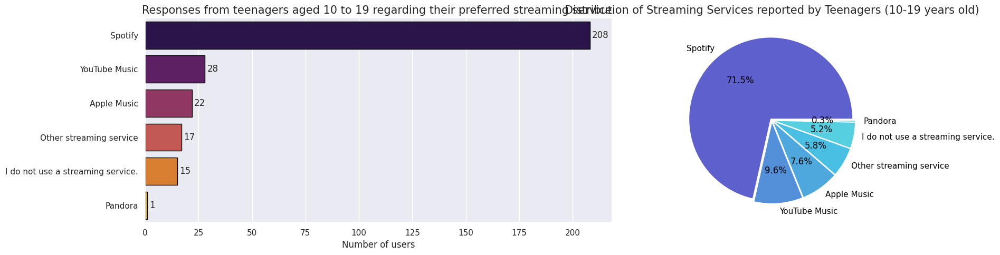

In [76]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
sns.barplot(
    x='quantity', 
    y='Primary streaming service',
    data=Teenagers, 
    edgecolor='black', 
    palette='inferno',
    ax=ax1)
for container in ax1.containers:
    ax1.bar_label(container, padding=3)
ax1.set_title('Responses from teenagers aged 10 to 19 regarding their preferred streaming service.', fontsize=15)
ax1.set_xlabel('Number of users', fontsize=12)
ax1.set_ylabel('')
quantity = list(Teenagers['quantity'].values)
services = list(Teenagers['Primary streaming service'].values)
colors = ['#5e60ce', '#5390d9', '#4ea8de', '#48bfe3', '#56cfe1','#64dfdf']
explode = (0.02, 0.02, 0.02, 0.02, 0.02, 0.02)
wedges, texts, autotexts = ax2.pie(
    quantity,
    labels=services,
    autopct='%1.1f%%',
    colors=colors,
    explode=explode)
ax2.set_title('Distribution of Streaming Services reported by Teenagers (10-19 years old)', fontsize=15)
for text in texts + autotexts:
    text.set_color('black')
plt.tight_layout()
plt.show()

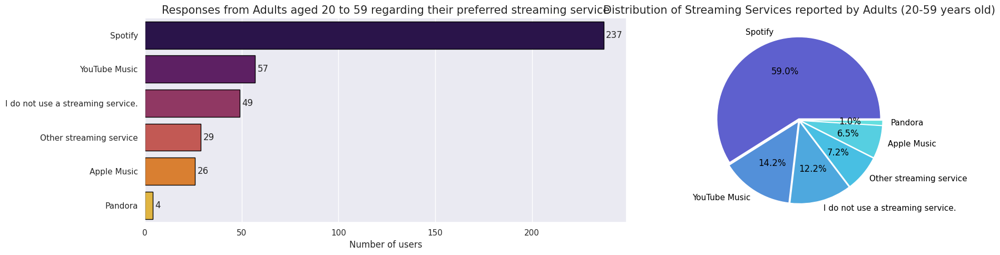

In [77]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
sns.barplot(
    x='quantity', 
    y='Primary streaming service',
    data=Adults, 
    edgecolor='black', 
    palette='inferno',
    ax=ax1)
for container in ax1.containers:
    ax1.bar_label(container, padding=3)
ax1.set_title('Responses from Adults aged 20 to 59 regarding their preferred streaming service', fontsize=15)
ax1.set_xlabel('Number of users', fontsize=12)
ax1.set_ylabel('')
quantity = list(Adults['quantity'].values)
services = list(Adults['Primary streaming service'].values)
colors = ['#5e60ce', '#5390d9', '#4ea8de', '#48bfe3', '#56cfe1','#64dfdf']
explode = (0.02, 0.02, 0.02, 0.02, 0.02, 0.02)
wedges, texts, autotexts = ax2.pie(
    quantity,
    labels=services,
    autopct='%1.1f%%',
    colors=colors,
    explode=explode)
ax2.set_title('Distribution of Streaming Services reported by Adults (20-59 years old)', fontsize=15)
for text in texts + autotexts:
    text.set_color('black')
plt.tight_layout()
plt.show()

- Spotify is the most popular streaming service among adults.

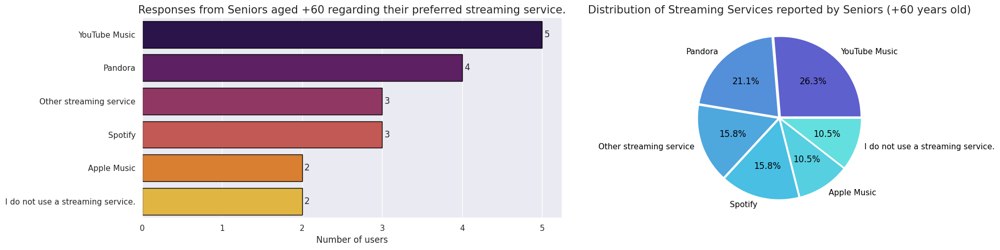

In [78]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
sns.barplot(
    x='quantity', 
    y='Primary streaming service',
    data=Seniors, 
    edgecolor='black', 
    palette='inferno',
    ax=ax1)
for container in ax1.containers:
    ax1.bar_label(container, padding=3)
ax1.set_title('Responses from Seniors aged +60 regarding their preferred streaming service.', fontsize=15)
ax1.set_xlabel('Number of users', fontsize=12)
ax1.set_ylabel('')
quantity = list(Seniors['quantity'].values)
services = list(Seniors['Primary streaming service'].values)
colors = ['#5e60ce', '#5390d9', '#4ea8de', '#48bfe3', '#56cfe1','#64dfdf']
explode = (0.02, 0.02, 0.02, 0.02, 0.02, 0.02)
wedges, texts, autotexts = ax2.pie(
    quantity,
    labels=services,
    autopct='%1.1f%%',
    colors=colors,
    explode=explode)
ax2.set_title('Distribution of Streaming Services reported by Seniors (+60 years old)', fontsize=15)
for text in texts + autotexts:
    text.set_color('black')
plt.tight_layout()
plt.show()

- YouTube Music is the most popular streaming service among teenagers.

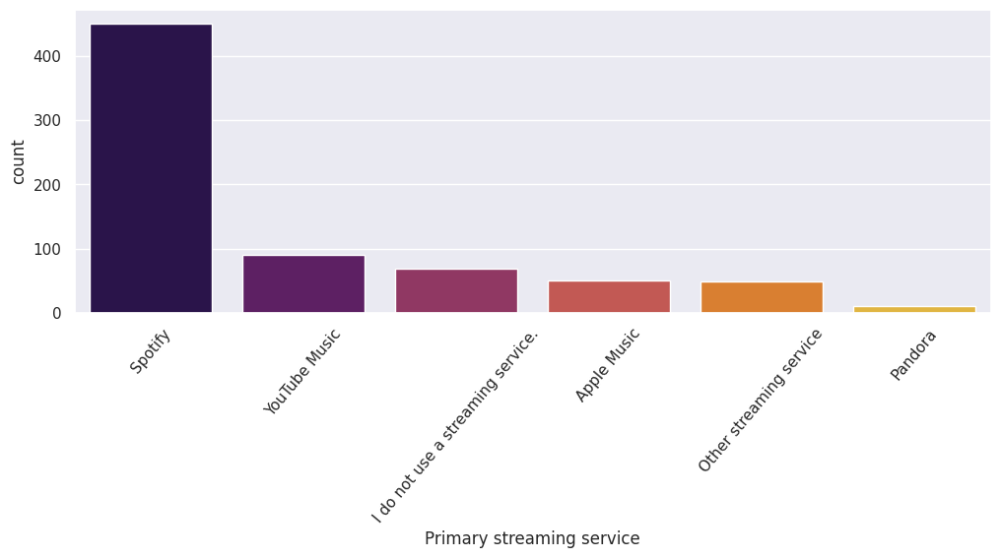

In [79]:
ww = dff["Primary streaming service"]
plt.figure(figsize=(12, 4))
plt.xticks(rotation=50)
sns.countplot(x=ww,palette='inferno')
plt.show()

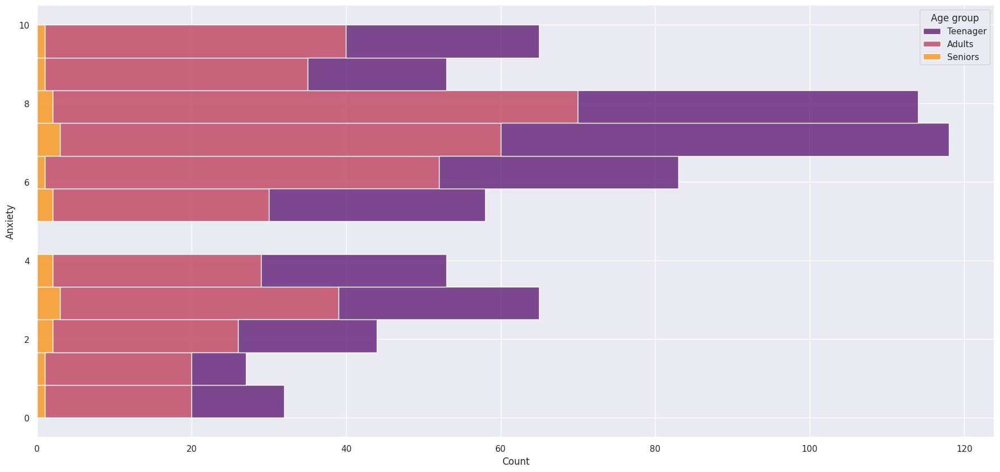

In [80]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Anxiety",palette='inferno',hue="Age group", multiple="stack")
plt.show()

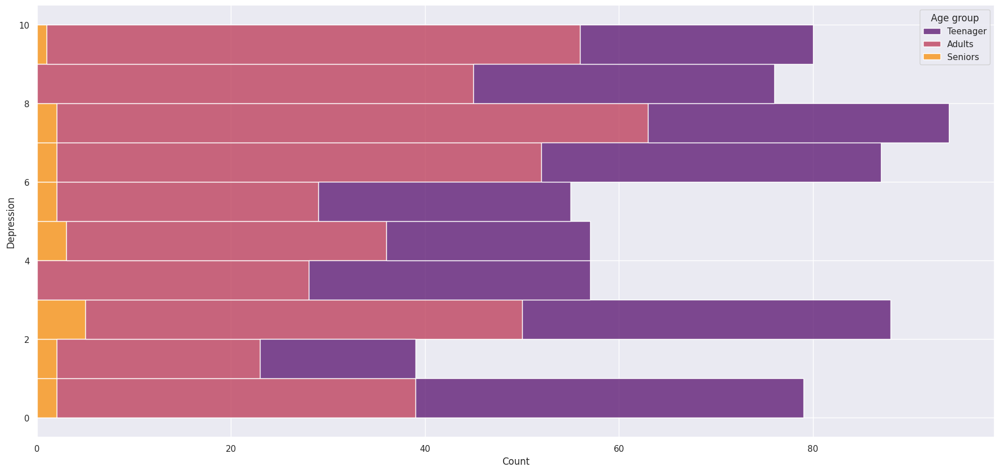

In [81]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Depression",bins=10,palette='inferno',hue="Age group", multiple="stack")
plt.show()

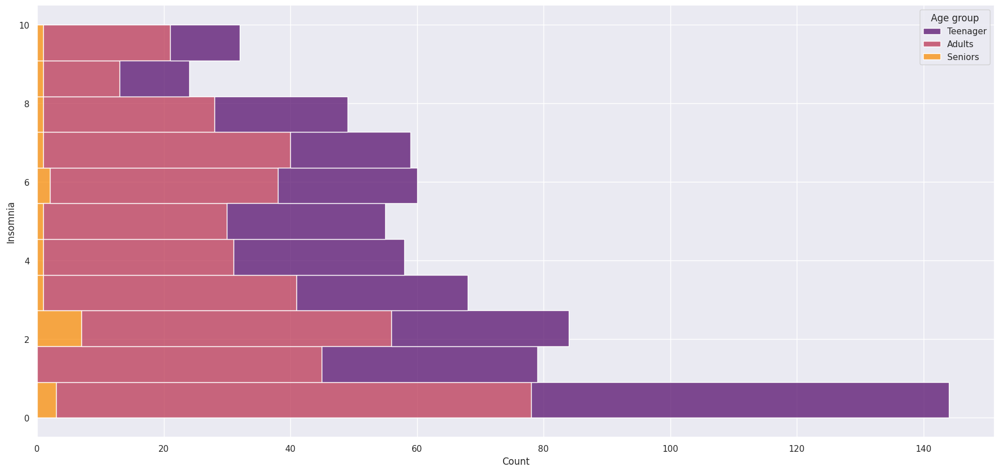

In [82]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Insomnia",palette='inferno',hue="Age group", multiple="stack")
plt.show()

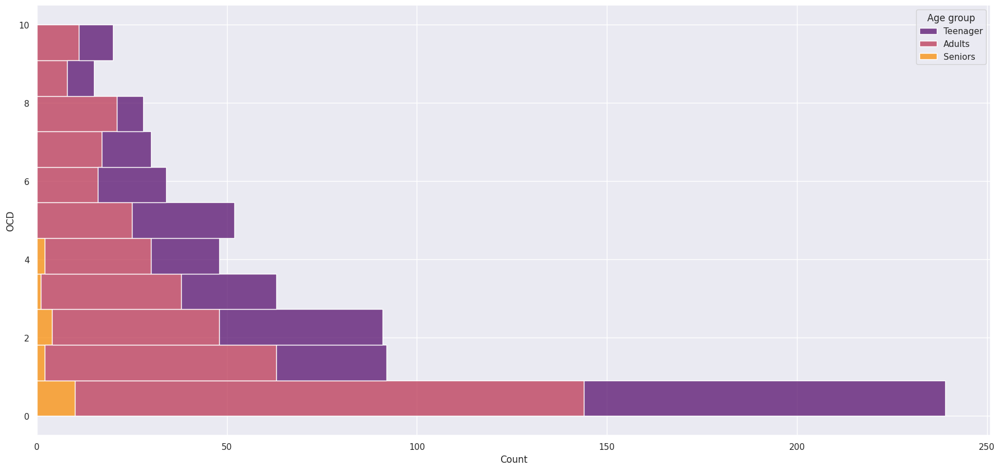

In [83]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="OCD",palette='inferno',hue="Age group", multiple="stack")
plt.show()

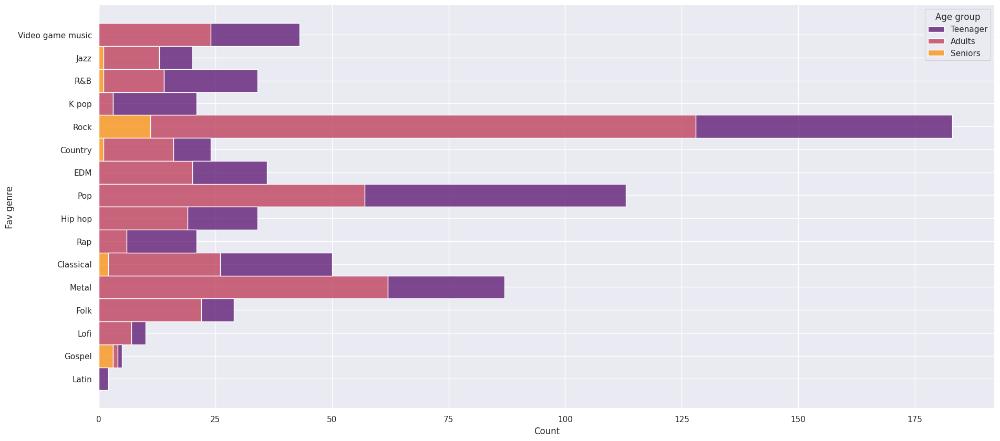

In [84]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Fav genre",palette='inferno',hue="Age group", multiple="stack")
plt.show()

- Majority of respondents listen to rock, Pop, and metal.

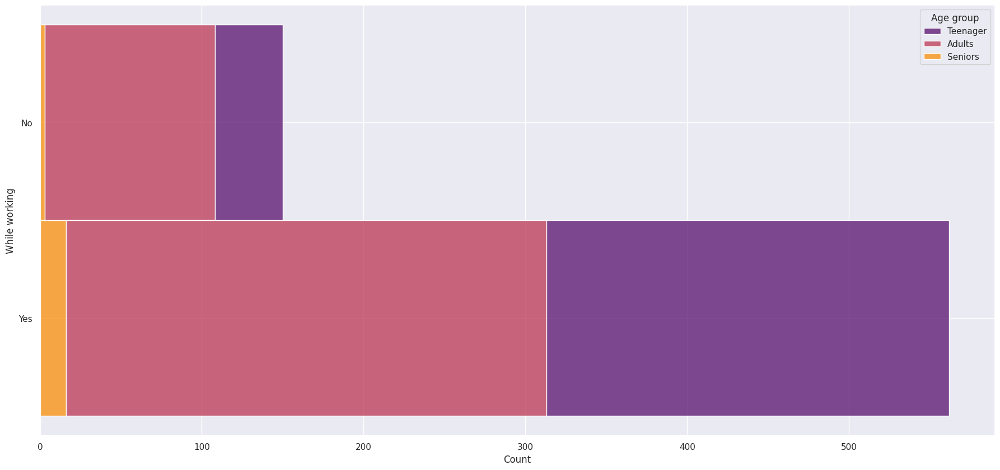

In [85]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="While working",palette='inferno',hue="Age group", multiple="stack")
plt.show()

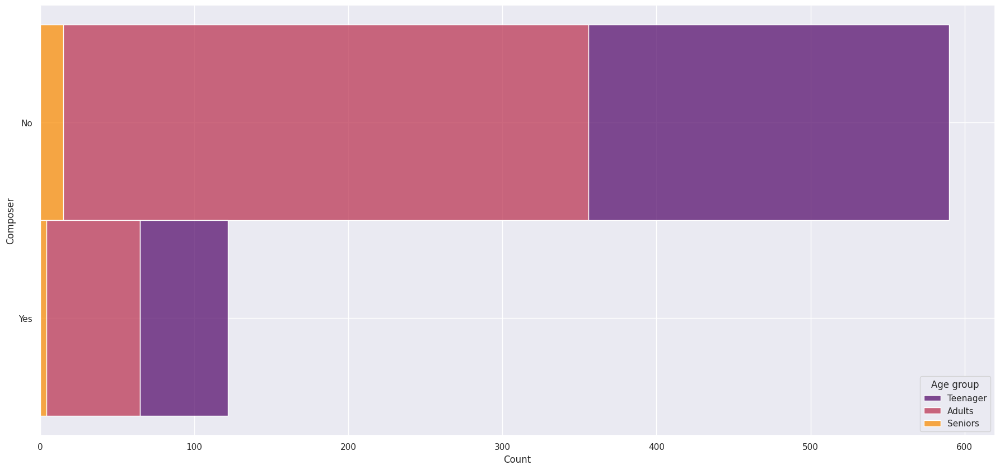

In [86]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Composer",palette='inferno',hue="Age group", multiple="stack")
plt.show()

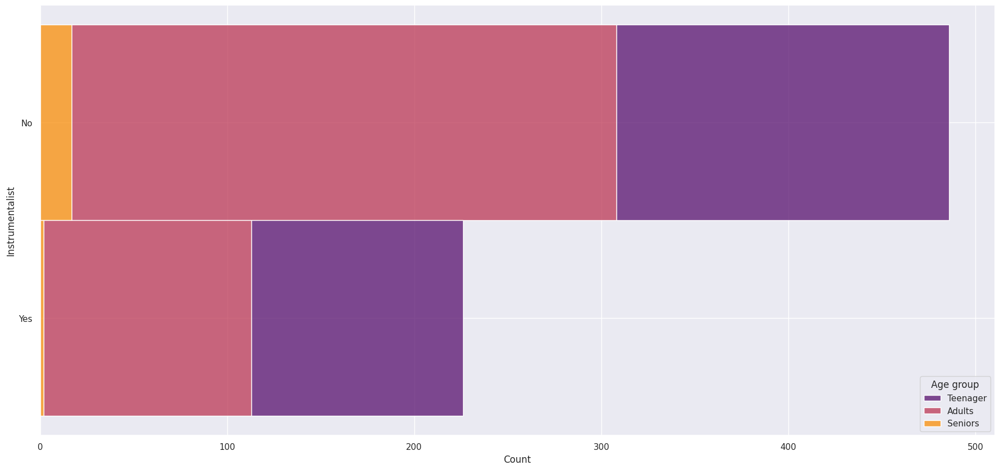

In [87]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Instrumentalist",palette='inferno',hue="Age group", multiple="stack")
plt.show()

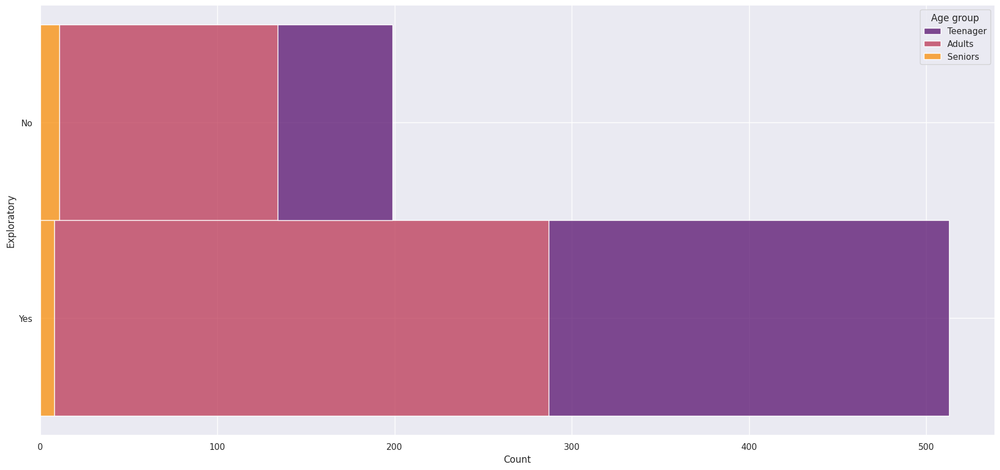

In [88]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Exploratory",palette='inferno',hue="Age group", multiple="stack")
plt.show()

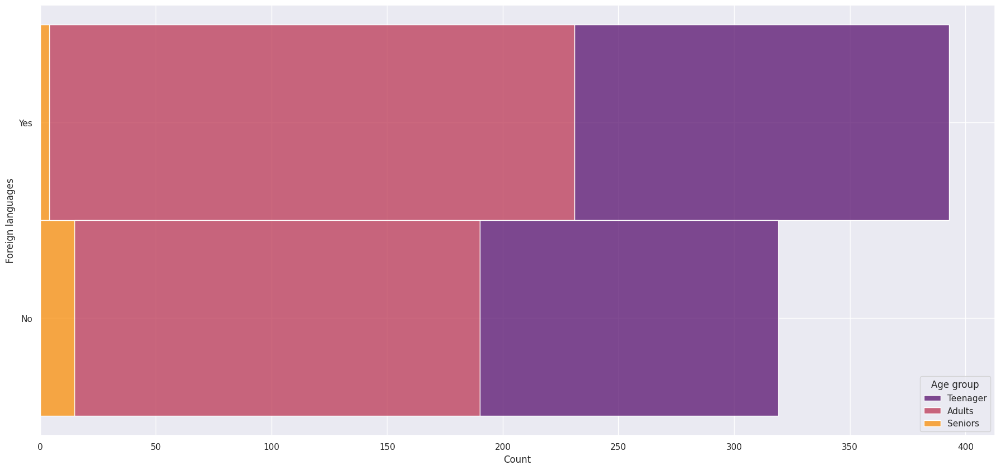

In [89]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Foreign languages",palette='inferno',hue="Age group", multiple="stack")
plt.show()

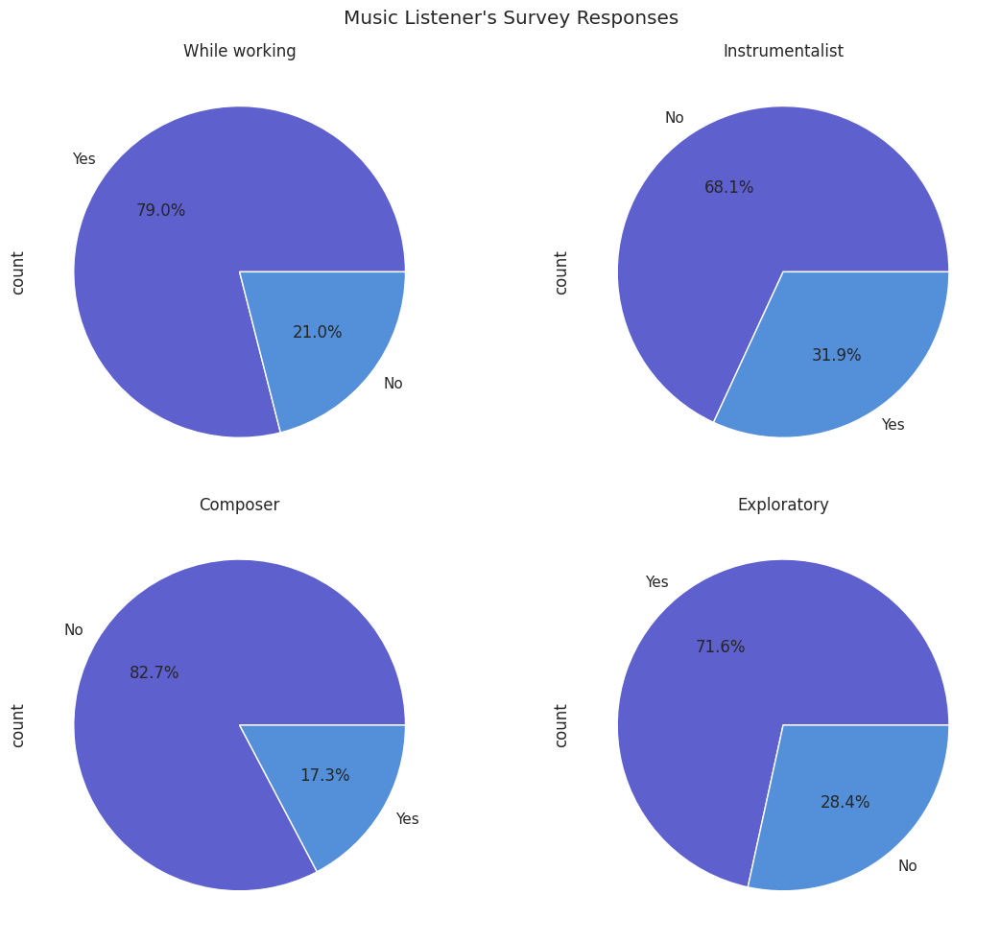

In [90]:
fig, ax = plt.subplots(figsize=(12, 10), nrows=2, ncols=2)
colors = ['#5e60ce', '#5390d9'] 
df['While working'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0, 0], colors=colors, title='While working')
df['Instrumentalist'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0, 1], colors=colors, title='Instrumentalist')
df['Composer'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[1, 0], colors=colors, title='Composer')
df['Exploratory'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[1, 1], colors=colors, title='Exploratory')
plt.suptitle("Music Listener's Survey Responses")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Music Effects on Mental Health')

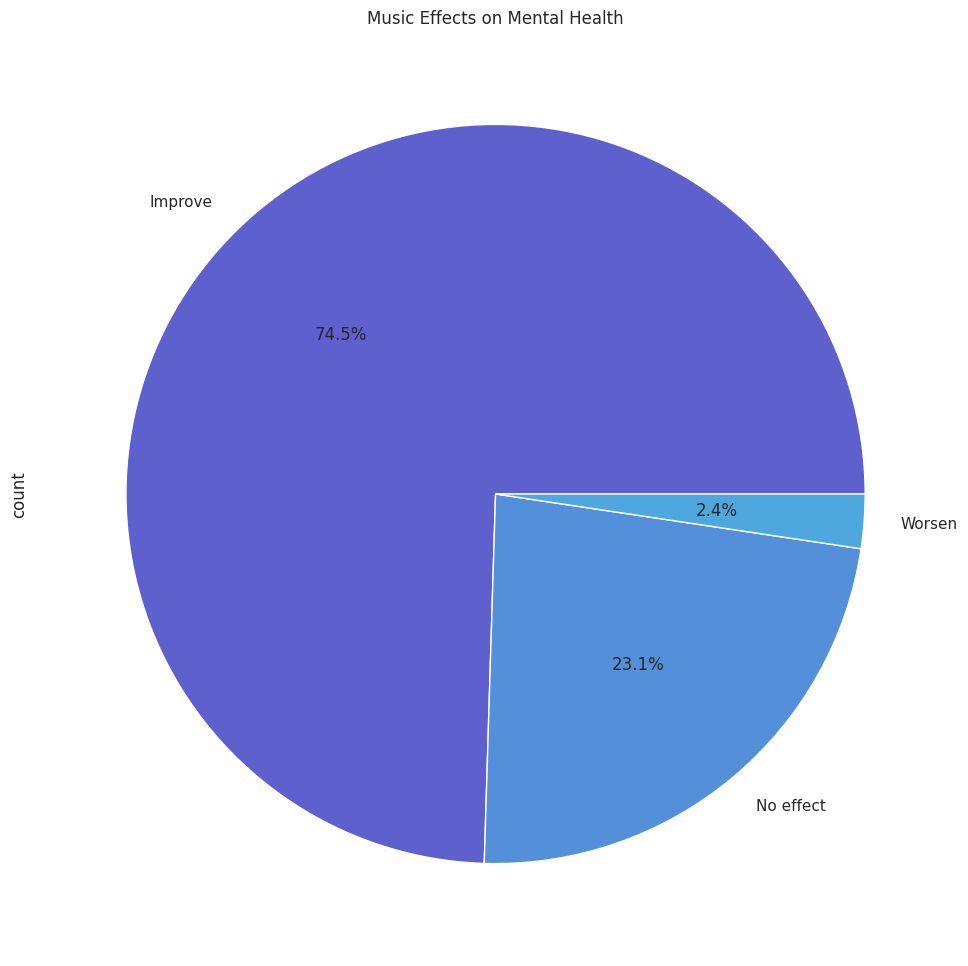

In [91]:
colors = ['#5e60ce', '#5390d9','#4ea8de','#48bfe3'] 
df['Music effects'].value_counts().plot.pie(autopct='%1.1f%%',colors=colors)
plt.title('Music Effects on Mental Health')

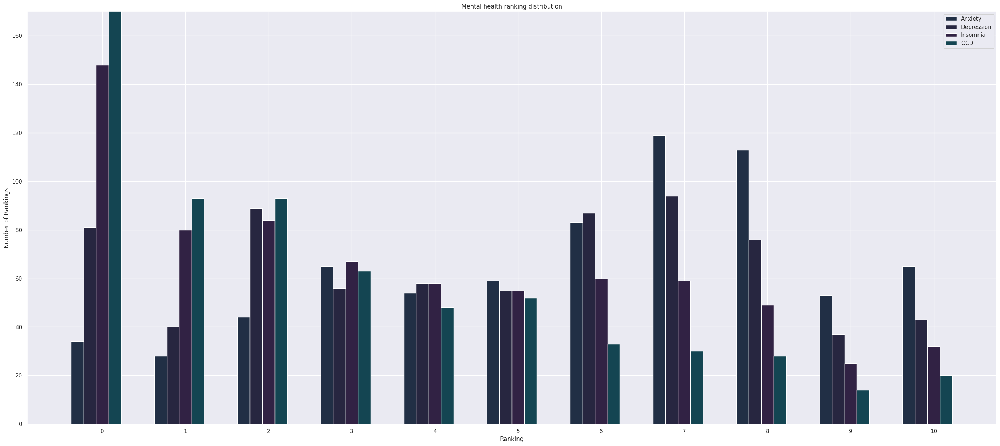

In [92]:
mentalsss = ["Anxiety", "Depression", "Insomnia", "OCD"]
mental = df[mentalsss]
mental.round(0).astype(int)
disorder_count = []
for disorder in mentalsss:
    x=0
    while x !=11:
        count =  (mental[disorder].values == x).sum()
        disorder_count.append(count)
        x +=1
labels = ['0','1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
x = np.arange(len(labels))
width = 0.15
fig, ax = plt.subplots(figsize=(35, 15))
o = ax.bar(x-2*width, disorder_count[0:11], width, label="Anxiety", color = '#212F45')
oo = ax.bar(x-width, disorder_count[11:22], width, label="Depression", color = '#272640')
oo = ax.bar(x, disorder_count[22:33], width, label="Insomnia", color = '#312244')
oo = ax.bar(x+width, disorder_count[33:], width, label="OCD", color = '#144552')
ax.set_ylim([0, 170])
ax.set_ylabel('Number of Rankings')
ax.set_xlabel('Ranking')
ax.set_title('Mental health ranking distribution')
ax.set_xticks(x, labels)
ax.legend()
plt.show()

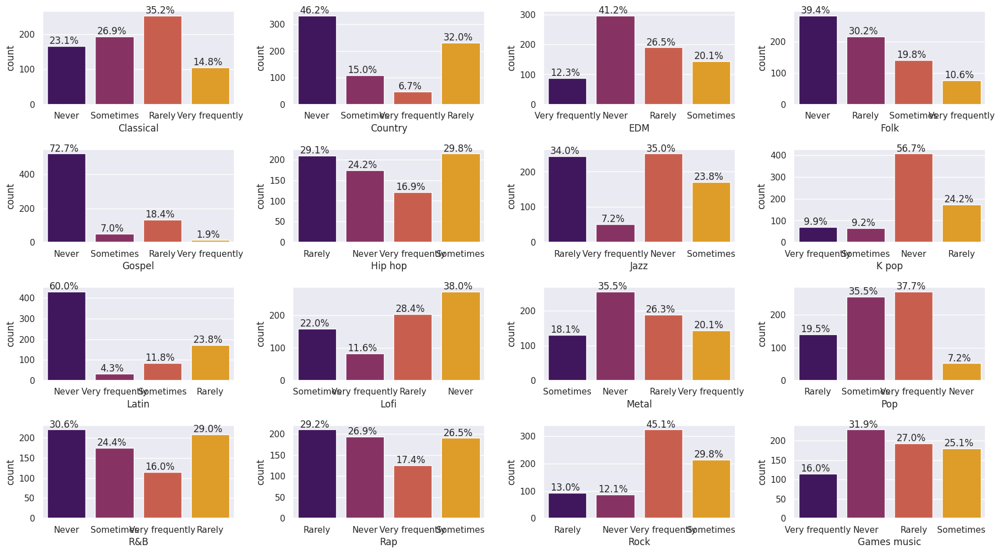

In [93]:
figure, axes = plt.subplots(4, 4, figsize=(18, 10))
genres = ['Classical', 'Country', 'EDM', 'Folk', 'Gospel', 'Hip hop', 'Jazz', 'K pop', 'Latin', 'Lofi', 'Metal', 'Pop', 'R&B', 'Rap', 'Rock', 'Games music']
palette = 'inferno'
for i, genre in enumerate(genres):
    row = i // 4
    col = i % 4
    ax = sns.countplot(ax=axes[row, col], x=dff[genre], palette=palette)
    total = len(dff[genre])
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_height()
        ax.annotate(percentage, (x, y), ha='center', va='bottom')
plt.tight_layout()
plt.show()

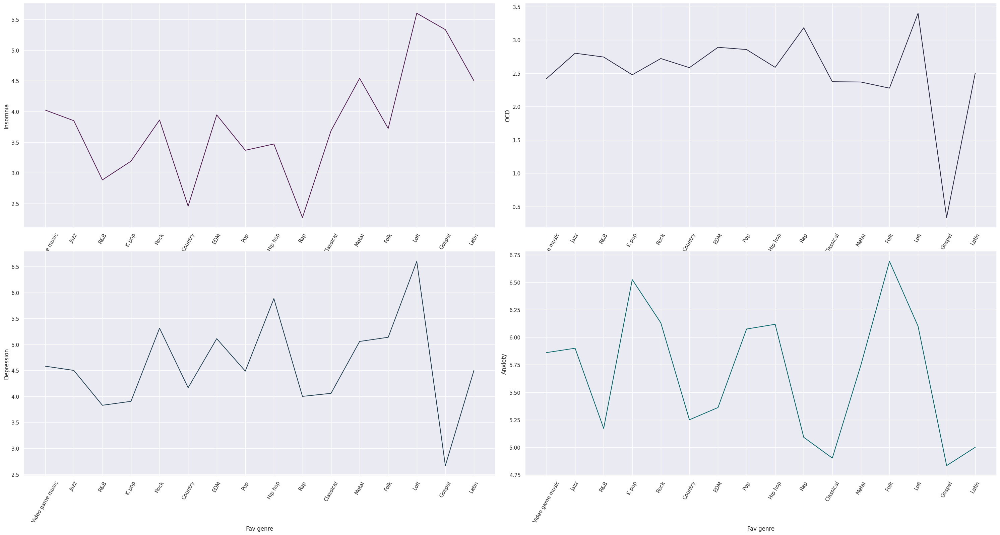

In [94]:
figure,axes=plt.subplots(2,2,figsize=(30,15))
sns.lineplot(ax=axes[0,0],x=dff['Fav genre'],y=dff['Insomnia'],ci=None,color='#4D194D')
sns.lineplot(ax=axes[0,1],x=dff['Fav genre'],y=dff['OCD'],ci=None,color='#272640')
sns.lineplot(ax=axes[1,0],x=dff['Fav genre'],y=dff['Depression'],ci=None,color='#1B3A4B')
sns.lineplot(ax=axes[1,1],x=dff['Fav genre'],y=dff['Anxiety'],ci=None,color='#006466')
plt.tight_layout()
for ax in axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.show()

In [95]:
colors = ['#006466', '#065A60', '#0B525B', '#144552','#1B3A4B', '#212F45', '#272640', '#312244','#3E1F47', '#4D194D']
fig = px.pie(dff, names='Fav genre', title='Genre Preferences',color_discrete_sequence=colors)
fig.show()

In [96]:
colors = ['#312244', '#212F45', '#144552', '#006466']
fig = px.sunburst(dff, path=["Fav genre"], values="Hours per day", color="Music effects",color_discrete_sequence=colors)
total = dff["Hours per day"].sum()
fig.update_traces(textinfo="label+percent entry")
fig.update_layout(
    title="Top Fav Genre VS Hours per day",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0))
fig.update_layout(width=1000, height=800)
fig.show()

In [97]:
percentages = dff['Fav genre'].value_counts(normalize=True) * 100
print(percentages)

Fav genre
Rock                25.626741
Pop                 15.877437
Metal               12.116992
Classical            7.103064
Video game music     5.988858
EDM                  5.013928
R&B                  4.874652
Hip hop              4.735376
Folk                 4.038997
Country              3.342618
Rap                  3.064067
K pop                2.924791
Jazz                 2.785515
Lofi                 1.392758
Gospel               0.835655
Latin                0.278552
Name: proportion, dtype: float64


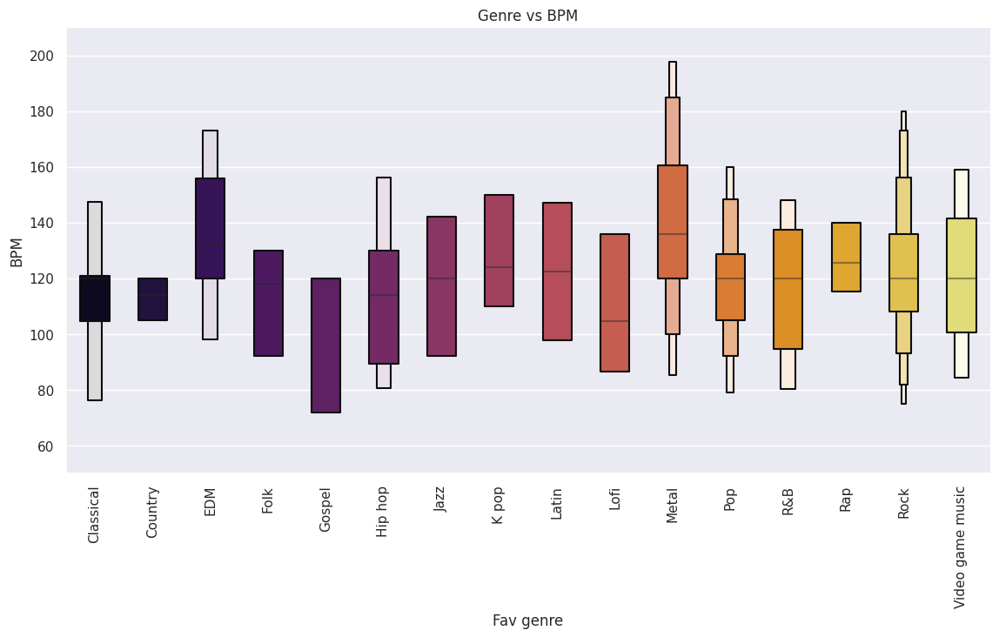

In [98]:
sns.catplot(
    data=dff.sort_values("Fav genre"),
    x="Fav genre", y="BPM", kind="boxen",height=6, aspect=2,width = 0.5,showfliers=False, palette='inferno')
plt.xticks(rotation = 90)
plt.title('Genre vs BPM')
plt.ylim(50, 210)
plt.show()

<Axes: xlabel='Fav genre', ylabel='Hours per day'>

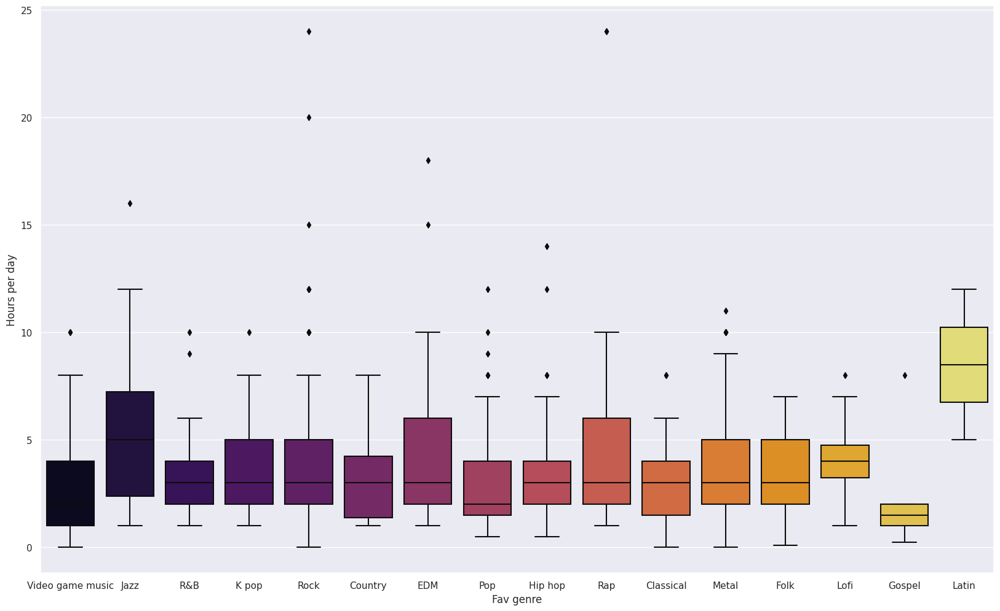

In [99]:
sns.boxplot(x=dff['Fav genre'], y=dff['Hours per day'], palette='inferno')

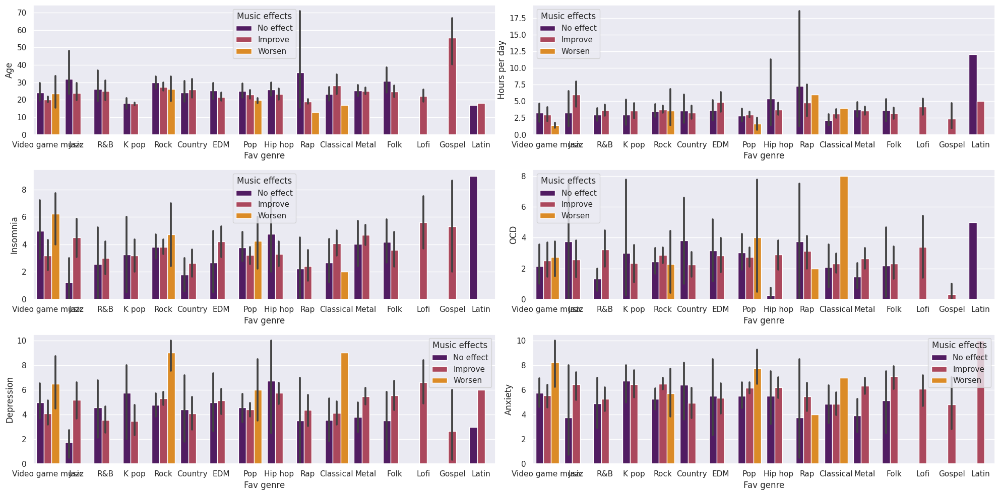

In [100]:
figure,axes=plt.subplots(3,2,figsize=(20,10))
sns.barplot(ax=axes[0,0],x=dff['Fav genre'],y=dff['Age'],hue=dff['Music effects'],palette="inferno")
sns.barplot(ax=axes[0,1],x=dff['Fav genre'],y=dff['Hours per day'],hue=dff['Music effects'],palette="inferno")
sns.barplot(ax=axes[1,0],x=dff['Fav genre'],y=dff['Insomnia'],hue=dff['Music effects'],palette="inferno")
sns.barplot(ax=axes[1,1],x=dff['Fav genre'],y=dff['OCD'],hue=dff['Music effects'],palette="inferno")
sns.barplot(ax=axes[2,0],x=dff['Fav genre'],y=dff['Depression'],hue=dff['Music effects'],palette="inferno")
sns.barplot(ax=axes[2,1],x=dff['Fav genre'],y=dff['Anxiety'],hue=dff['Music effects'],palette="inferno")
plt.tight_layout()
plt.show()

Based on the above charts, the following observations can be made:

1. **Gospel Music**: Most commonly listened to by individuals experiencing insomnia and in older age groups, where it has been reported to help improve the condition.

2. **Lofi Music**: Predominantly favored by individuals dealing with OCD, Anxiety, and Depression, typically in their mid-20s. It has shown to improve these conditions among participants.

3. **Video Game Music**: Shows a detrimental effect on all mental health conditions and should therefore be avoided. Listeners are usually in their early 20s, suggesting potential impacts on social functioning.

4. **R&B, Jazz, K-pop, Country, EDM, Hip hop, Folk, Metal, and Latin Music**: Generally either have a positive impact in improving mental health conditions or have no discernible negative effects reported.

5. **Rock Music**: Should be avoided by individuals dealing with Insomnia and Depression due to its potential to worsen these conditions more than improve them.

6. **Classical Music**: Should be avoided by individuals dealing with OCD, Anxiety, and Depression as it has a higher likelihood of worsening these conditions compared to improving them. However, it shows potential for improving Insomnia.

7. **Listening Habits**: Listening to Lofi and Gospel music for 4-6 hours has been associated with improvements in the mentioned conditions. Conversely, even 2 hours of exposure to Video Game music and pop has shown worsening effects in some participants.

- **Anxiety Levels**:

      All listeners have some degree of anxiety, but those who favor Rock, Jazz, K-pop, Hip hop, Pop, and Folk music are particularly affected, with anxiety levels exceeding 6. This suggests that these genres might be associated with higher stress or anxiety, possibly due to their energetic or emotionally charged nature.
 
- **Insomnia Levels**:

      Generally, listeners experience low levels of insomnia (below 4). However, those who listen to Metal, Lofi, and Gospel music experience higher levels of insomnia. This could be due to the intense or calming effects of these genres, which might impact sleep patterns differently.

- **OCD Levels**:

      OCD tendencies are more pronounced in listeners of Rap and Lofi music, with maximum levels above 3. This indicates a potential correlation between these genres and obsessive-compulsive behaviors or traits.
      
- **Depression Levels**:

      High levels of depression (above 5) are noted among listeners of Lofi, Hip hop, and Rock music. These genres might resonate more with individuals experiencing depressive symptoms or might influence mood negatively.
      
- **Mental Health Improvements and Deteriorations**:

      While music generally provides therapeutic benefits, listeners of Rock, Video Game Music, Pop, Rap, and Classical music often experience worsening conditions. This suggests that these genres might exacerbate mental health issues for some individuals.
      
- **OCD and Music**: Listeners of Rock, Video Game Music, Pop, Rap, and Classical music show varying levels of OCD, with the highest levels found among Classical music listeners. This might be due to the structured and repetitive nature of Classical music, which could influence obsessive behaviors.

- **Anxiety and Music**: Anxiety is present in listeners of Rock, Video Game Music, Pop, and Classical music, with Video Game Music listeners exhibiting the highest levels. The immersive and often intense nature of Video Game Music might contribute to increased anxiety.

- **Insomnia and Music**: Insomnia is notably present among listeners of Rock, Video Game Music, Pop, and Classical music. The stimulating nature of these genres, particularly Video Game Music, might disrupt sleep patterns.

- **Depression and Music**: High levels of depression are found among listeners of Rock, Video Game Music, Pop, and Classical music. These genres might either attract listeners who are already depressed or contribute to depressive moods.

These insights underscore the importance of considering musical preferences and their potential impact on mental health conditions, highlighting certain genres that may be beneficial or detrimental depending on individual circumstances.

It's evident that various types of music can profoundly influence an individual's mental state. Therefore, considering one's current mood, overall disposition, and the duration of music exposure, recommendation systems in music applications can effectively suggest genres that potentially alleviate or improve their mental condition.

Music has a unique ability to evoke emotions and alter psychological states. For instance, genres like Gospel and Lofi have shown positive impacts on listeners dealing with specific conditions such as insomnia, OCD, anxiety, and depression. These findings suggest that tailored music recommendations can play a crucial role in enhancing mental well-being.